In [ ]:
import librosa
import numpy as np
import matplotlib.pyplot as plt
from librosa import magphase
import os

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Set paths
root_dir = '/content/drive/MyDrive/Project_dataset'  # Path to main data folder

# Define animal categories
animals = ['Elephant','Tiger', 'Leopard', 'Otter','Birds']

# Iterate through each animal category
for animal in animals:
    animal_folder = os.path.join(root_dir, animal)
    file_count = len(os.listdir(animal_folder))
    print(f"{animal.capitalize()} has {file_count} files.")


Elephant has 150 files.
Tiger has 300 files.
Leopard has 150 files.
Otter has 150 files.
Birds has 150 files.


Elephant has 150 files.
Tiger has 300 files.
Leopard has 150 files.
Otter has 150 files.
Birds has 150 files.


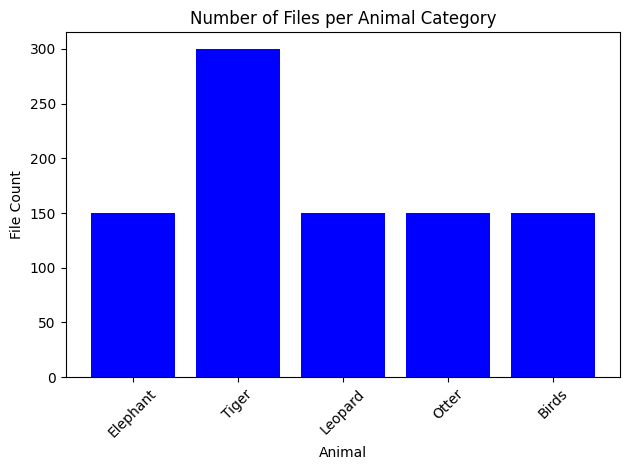

In [ ]:
import os
import matplotlib.pyplot as plt

# Set paths
root_dir = '/content/drive/MyDrive/Project_dataset'  # Path to main data folder

# Define animal categories
animals = ['Elephant', 'Tiger', 'Leopard', 'Otter','Birds']

# List to store file counts
file_counts = []

# Iterate through each animal category
for animal in animals:
    animal_folder = os.path.join(root_dir, animal)
    file_count = len(os.listdir(animal_folder))
    file_counts.append(file_count)
    print(f"{animal.capitalize()} has {file_count} files.")

# Create a bar graph to visualize file counts
plt.bar(animals, file_counts, color='blue')
plt.xlabel('Animal')
plt.ylabel('File Count')
plt.title('Number of Files per Animal Category')
plt.xticks(rotation=45)
plt.tight_layout()

# Show the graph
plt.show()


# **Noise Injection - Augmentation**

## ***Tiger***


In [ ]:
from IPython.display import Audio

# Replace with the correct file path
file_path = "/content/drive/MyDrive/Project_dataset/Tiger/track 1.wav"

# Play the audio
Audio(file_path)


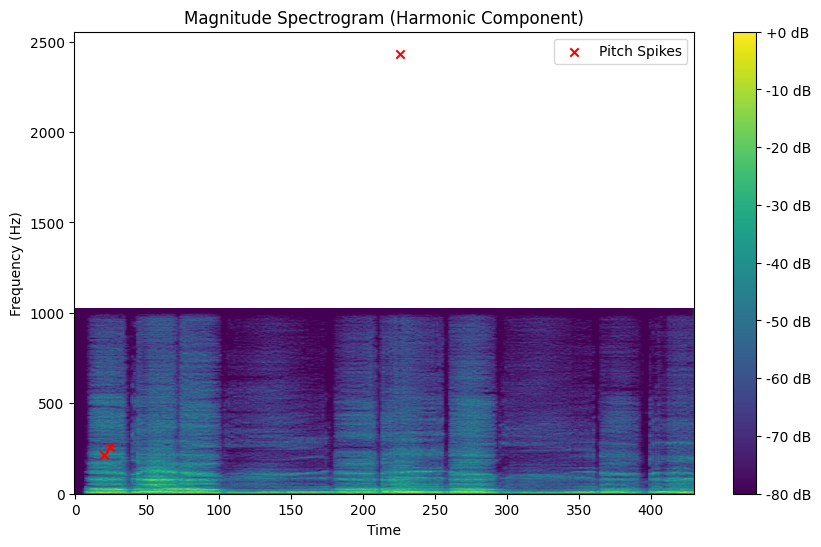

In [ ]:
import librosa
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks

# Replace "audio_example.wav" with the correct file path
PATH = "/content/drive/MyDrive/Project_dataset/Tiger/track 1.wav"

# Load the audio file using librosa
original_audio, sample_rate = librosa.load(PATH)

# Harmonic-Percussive Source Separation
harmonic, percussive = librosa.effects.hpss(original_audio)

# Compute the magnitude spectrogram of the harmonic component
harmonic_mag = np.abs(librosa.stft(harmonic))

# Find peaks in the harmonic magnitude spectrogram
peaks, _ = find_peaks(harmonic_mag.max(axis=0), height=100)  # You can adjust the height threshold as needed

# Convert peak indices to frequencies
frequencies = librosa.fft_frequencies(sr=sample_rate, n_fft=2048)  # n_fft is the window size used in STFT

# Get the corresponding frequencies for the detected peaks
peak_frequencies = frequencies[peaks]

# Plot the magnitude spectrogram
plt.figure(figsize=(10, 6))
plt.imshow(librosa.amplitude_to_db(harmonic_mag, ref=np.max), origin='lower', aspect='auto', cmap='viridis')
plt.xlabel('Time')
plt.ylabel('Frequency (Hz)')
plt.title('Magnitude Spectrogram (Harmonic Component)')
plt.colorbar(format='%+2.0f dB')

# Plot the peaks on the graph
plt.scatter(peaks, peak_frequencies, color='red', marker='x', label='Pitch Spikes')

plt.legend()
plt.show()

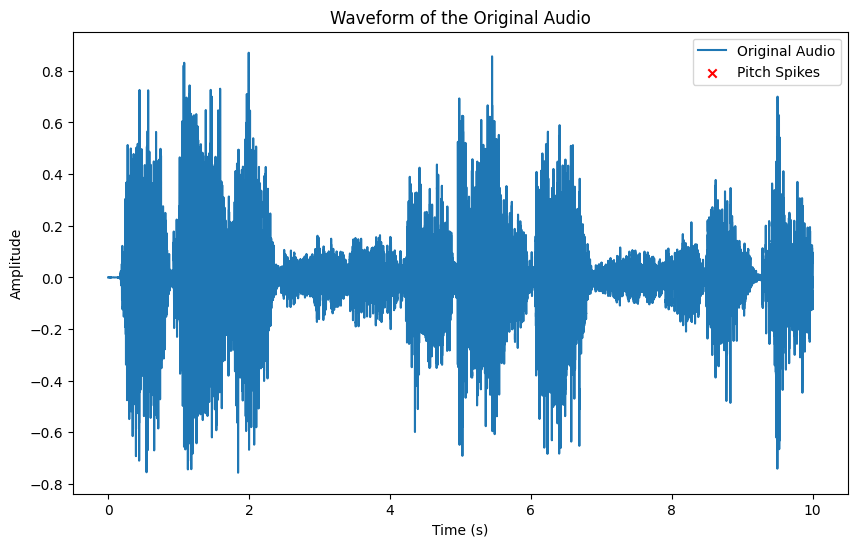

In [ ]:
# Replace "audio_example.wav" with the correct file path
PATH = "/content/drive/MyDrive/Project_dataset/Tiger/track 1.wav"

# Load the audio file using librosa
original_audio, sample_rate = librosa.load(PATH)

# Harmonic-Percussive Source Separation
harmonic, percussive = librosa.effects.hpss(original_audio)

# Compute the magnitude spectrogram of the harmonic component
harmonic_mag = np.abs(librosa.stft(harmonic))

# Find peaks in the harmonic magnitude spectrogram
peaks, _ = find_peaks(harmonic_mag.max(axis=0), height=100)  # You can adjust the height threshold as needed

# Convert peak indices to time values
times = librosa.times_like(harmonic_mag, sr=sample_rate)  # Time values corresponding to each column in the spectrogram

# Get the corresponding time values for the detected peaks
peak_times = times[peaks]

# Plot the original audio waveform
plt.figure(figsize=(10, 6))
plt.plot(np.arange(len(original_audio)) / sample_rate, original_audio, label='Original Audio')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('Waveform of the Original Audio')

# Plot the pitch spikes on the waveform
plt.scatter(peak_times, original_audio[peaks], color='red', marker='x', label='Pitch Spikes')

plt.legend()
plt.show()

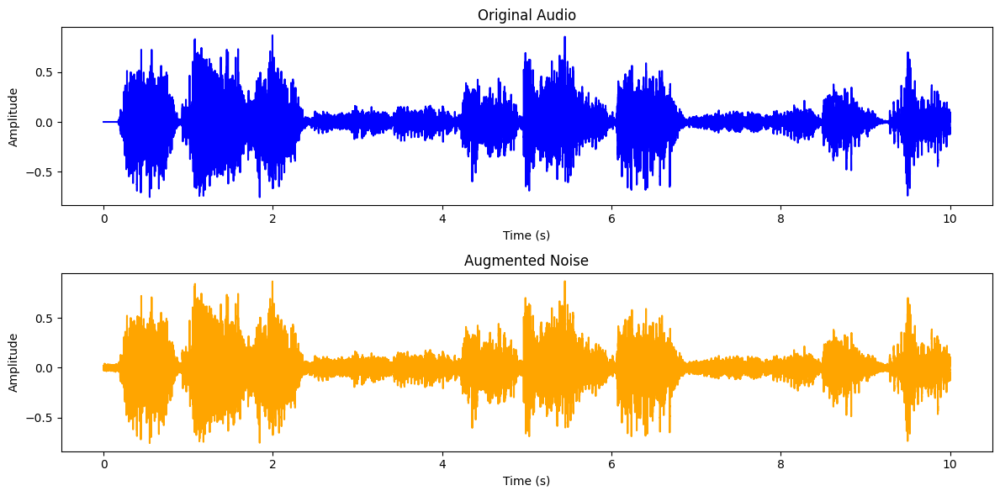

In [ ]:
import soundfile as sf
import random
import matplotlib.pyplot as plt

# Replace "audio_example.wav" with the correct file path
PATH = "/content/drive/MyDrive/Project_dataset/Tiger/track 1.wav"

# Load the original audio file using librosa
original_audio, sample_rate = librosa.load(PATH)

# Function to apply data augmentation
def augment_audio(audio_data, sample_rate):
    # Your data augmentation code here
    # For example, let's add some random Gaussian noise to the audio
    augmented_audio = audio_data + 0.01 * np.random.randn(len(audio_data))
    return augmented_audio

# Augment the original audio
augmented_audio = augment_audio(original_audio, sample_rate)

# Create a time axis for plotting
time_axis = np.linspace(0, len(original_audio) / sample_rate, len(original_audio))

# Plot the original audio waveform in blue
plt.figure(figsize=(12, 6))
plt.subplot(2, 1, 1)
plt.plot(time_axis, original_audio, color='blue')
plt.title('Original Audio')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')

# Plot the augmented audio waveform in orange
plt.subplot(2, 1, 2)
plt.plot(time_axis, augmented_audio, color='orange')
plt.title('Augmented Noise')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')

plt.tight_layout()
plt.show()


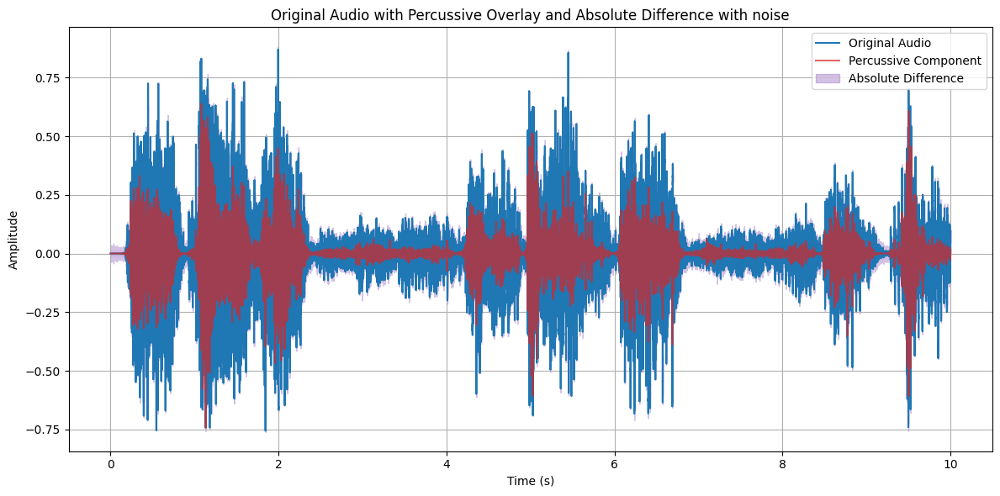

In [ ]:
# Replace with the correct file path
PATH = "/content/drive/MyDrive/Project_dataset/Tiger/track 1.wav"

# Load the original audio file using librosa
original_audio, sample_rate = librosa.load(PATH)

# Function to apply data augmentation
def augment_audio(audio_data, scale=0.01):
    augmented_audio = audio_data + scale * np.random.randn(len(audio_data))
    return augmented_audio

# Augment the original audio
augmented_audio = augment_audio(original_audio)

# Calculate the absolute difference between the two waveforms
difference = np.abs(augmented_audio - original_audio)

# Create a time axis for plotting
time_axis = np.linspace(0, len(original_audio) / sample_rate, len(original_audio))

# Reference code for displaying multiple waveforms
y_harm, y_perc = librosa.effects.hpss(original_audio)

# Set up color palette
original_color = '#1f77b4'  # Blue
percussive_color = '#d62728'  # Red
difference_color = '#9467bd'  # Purple

# Plot the original audio waveform and the difference
plt.figure(figsize=(12, 6))

# Plot the original audio waveform
plt.plot(time_axis, original_audio, color=original_color, label='Original Audio')

# Overlay the percussive component on the original waveform
plt.plot(time_axis, y_perc, color=percussive_color, label='Percussive Component', alpha=0.7)

# Plot the absolute difference as a shaded region
plt.fill_between(time_axis, original_audio - difference, original_audio + difference, color=difference_color, alpha=0.4, label='Absolute Difference')

plt.title('Original Audio with Percussive Overlay and Absolute Difference with noise')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.legend()
plt.tight_layout()
plt.grid(True)
plt.show()


In [ ]:
# Replace with your input folder path
input_folder_path = "/content/drive/MyDrive/Project_dataset/Tiger"

# Replace with your output folder path
output_folder_path = "/content/drive/MyDrive/ Augmentation/ Noise/ Noise_Tiger"

# Function to apply data augmentation
def augment_audio(audio_data, sample_rate):
    augmented_audio = audio_data + 0.01 * np.random.randn(len(audio_data))
    return augmented_audio

# List all files in the input folder
all_files = os.listdir(input_folder_path)
audio_files = [file for file in all_files if file.endswith(".wav")]

# Ensure the output folder exists
os.makedirs(output_folder_path, exist_ok=True)

# Process each audio file in the folder
for audio_file in audio_files:
    file_path = os.path.join(input_folder_path, audio_file)
    audio_data, sample_rate = librosa.load(file_path)

    augmented_audio = augment_audio(audio_data, sample_rate)

    # Create the output file path in the output folder
    output_file = os.path.splitext(audio_file)[0] + "_augmentednoise.wav"
    output_path = os.path.join(output_folder_path, output_file)

    # Save the augmented audio
    sf.write(output_path, augmented_audio, sample_rate)


## ***Birds***

In [ ]:
from IPython.display import Audio

# Replace with the correct file path
file_path = "/content/drive/MyDrive/Project_dataset/Birds/bird1.wav"

# Play the audio
Audio(file_path)


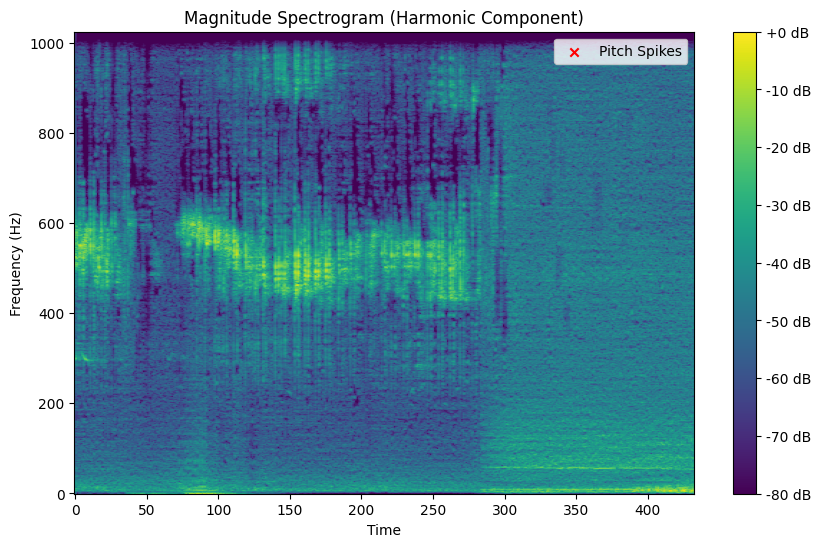

In [ ]:
import librosa
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks

# Replace "audio_example.wav" with the correct file path
PATH = "/content/drive/MyDrive/Project_dataset/Birds/bird1.wav"

# Load the audio file using librosa
original_audio, sample_rate = librosa.load(PATH)

# Harmonic-Percussive Source Separation
harmonic, percussive = librosa.effects.hpss(original_audio)

# Compute the magnitude spectrogram of the harmonic component
harmonic_mag = np.abs(librosa.stft(harmonic))

# Find peaks in the harmonic magnitude spectrogram
peaks, _ = find_peaks(harmonic_mag.max(axis=0), height=100)  # You can adjust the height threshold as needed

# Convert peak indices to frequencies
frequencies = librosa.fft_frequencies(sr=sample_rate, n_fft=2048)  # n_fft is the window size used in STFT

# Get the corresponding frequencies for the detected peaks
peak_frequencies = frequencies[peaks]

# Plot the magnitude spectrogram
plt.figure(figsize=(10, 6))
plt.imshow(librosa.amplitude_to_db(harmonic_mag, ref=np.max), origin='lower', aspect='auto', cmap='viridis')
plt.xlabel('Time')
plt.ylabel('Frequency (Hz)')
plt.title('Magnitude Spectrogram (Harmonic Component)')
plt.colorbar(format='%+2.0f dB')

# Plot the peaks on the graph
plt.scatter(peaks, peak_frequencies, color='red', marker='x', label='Pitch Spikes')

plt.legend()
plt.show()

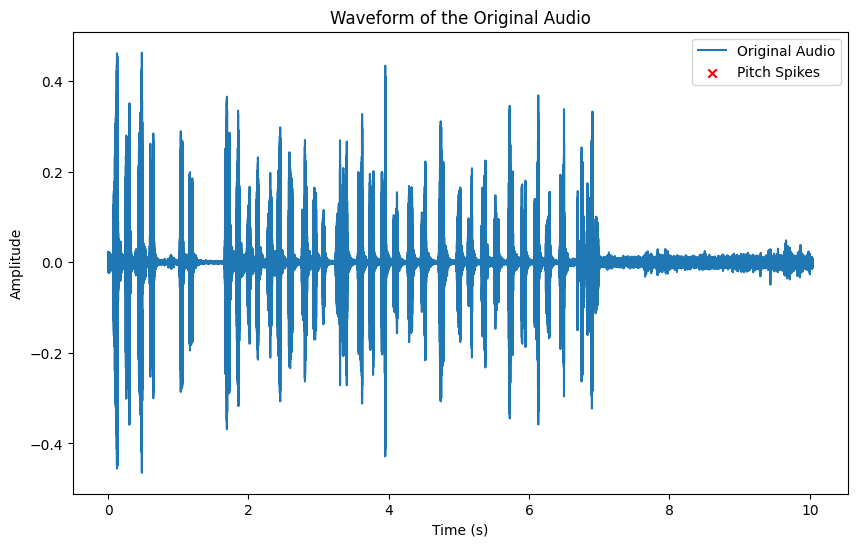

In [ ]:
# Replace "audio_example.wav" with the correct file path
PATH = "/content/drive/MyDrive/Project_dataset/Birds/bird1.wav"

# Load the audio file using librosa
original_audio, sample_rate = librosa.load(PATH)

# Harmonic-Percussive Source Separation
harmonic, percussive = librosa.effects.hpss(original_audio)

# Compute the magnitude spectrogram of the harmonic component
harmonic_mag = np.abs(librosa.stft(harmonic))

# Find peaks in the harmonic magnitude spectrogram
peaks, _ = find_peaks(harmonic_mag.max(axis=0), height=100)  # You can adjust the height threshold as needed

# Convert peak indices to time values
times = librosa.times_like(harmonic_mag, sr=sample_rate)  # Time values corresponding to each column in the spectrogram

# Get the corresponding time values for the detected peaks
peak_times = times[peaks]

# Plot the original audio waveform
plt.figure(figsize=(10, 6))
plt.plot(np.arange(len(original_audio)) / sample_rate, original_audio, label='Original Audio')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('Waveform of the Original Audio')

# Plot the pitch spikes on the waveform
plt.scatter(peak_times, original_audio[peaks], color='red', marker='x', label='Pitch Spikes')

plt.legend()
plt.show()

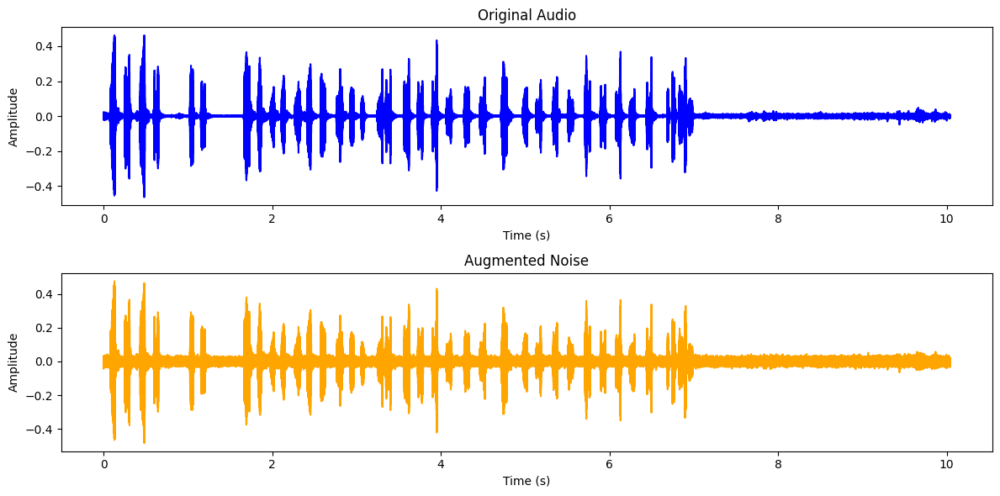

In [ ]:
import soundfile as sf
import random
import matplotlib.pyplot as plt

# Replace "audio_example.wav" with the correct file path
PATH = "/content/drive/MyDrive/Project_dataset/Birds/bird1.wav"

# Load the original audio file using librosa
original_audio, sample_rate = librosa.load(PATH)

# Function to apply data augmentation
def augment_audio(audio_data, sample_rate):
    # Your data augmentation code here
    # For example, let's add some random Gaussian noise to the audio
    augmented_audio = audio_data + 0.01 * np.random.randn(len(audio_data))
    return augmented_audio

# Augment the original audio
augmented_audio = augment_audio(original_audio, sample_rate)

# Create a time axis for plotting
time_axis = np.linspace(0, len(original_audio) / sample_rate, len(original_audio))

# Plot the original audio waveform in blue
plt.figure(figsize=(12, 6))
plt.subplot(2, 1, 1)
plt.plot(time_axis, original_audio, color='blue')
plt.title('Original Audio')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')

# Plot the augmented audio waveform in orange
plt.subplot(2, 1, 2)
plt.plot(time_axis, augmented_audio, color='orange')
plt.title('Augmented Noise')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')

plt.tight_layout()
plt.show()


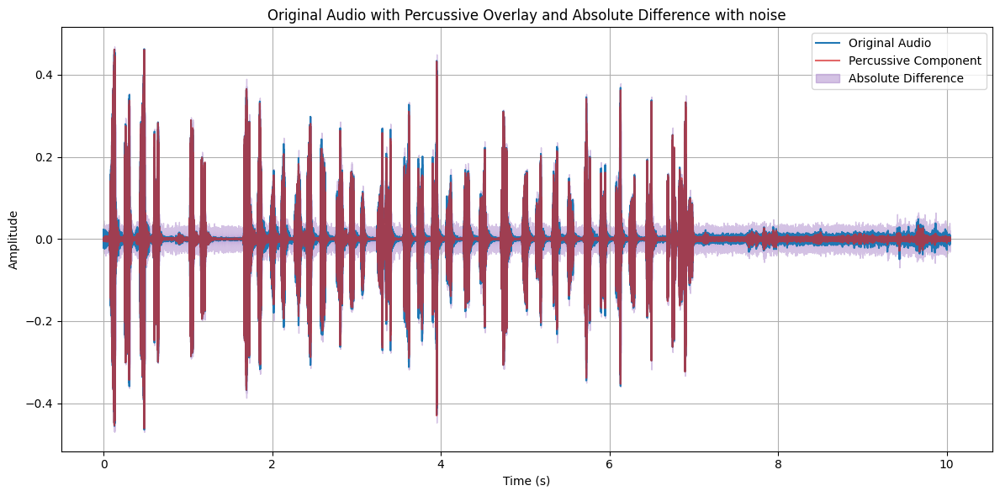

In [ ]:
# Replace with the correct file path
PATH = "/content/drive/MyDrive/Project_dataset/Birds/bird1.wav"

# Load the original audio file using librosa
original_audio, sample_rate = librosa.load(PATH)

# Function to apply data augmentation
def augment_audio(audio_data, scale=0.01):
    augmented_audio = audio_data + scale * np.random.randn(len(audio_data))
    return augmented_audio

# Augment the original audio
augmented_audio = augment_audio(original_audio)

# Calculate the absolute difference between the two waveforms
difference = np.abs(augmented_audio - original_audio)

# Create a time axis for plotting
time_axis = np.linspace(0, len(original_audio) / sample_rate, len(original_audio))

# Reference code for displaying multiple waveforms
y_harm, y_perc = librosa.effects.hpss(original_audio)

# Set up color palette
original_color = '#1f77b4'  # Blue
percussive_color = '#d62728'  # Red
difference_color = '#9467bd'  # Purple

# Plot the original audio waveform and the difference
plt.figure(figsize=(12, 6))

# Plot the original audio waveform
plt.plot(time_axis, original_audio, color=original_color, label='Original Audio')

# Overlay the percussive component on the original waveform
plt.plot(time_axis, y_perc, color=percussive_color, label='Percussive Component', alpha=0.7)

# Plot the absolute difference as a shaded region
plt.fill_between(time_axis, original_audio - difference, original_audio + difference, color=difference_color, alpha=0.4, label='Absolute Difference')

plt.title('Original Audio with Percussive Overlay and Absolute Difference with noise')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.legend()
plt.tight_layout()
plt.grid(True)
plt.show()


In [ ]:
# Replace with your input folder path
input_folder_path = "/content/drive/MyDrive/Project_dataset/Birds"

# Replace with your output folder path
output_folder_path = "/content/drive/MyDrive/ Augmentation/ Noise/ Noise_Birds"

# Function to apply data augmentation
def augment_audio(audio_data, sample_rate):
    augmented_audio = audio_data + 0.01 * np.random.randn(len(audio_data))
    return augmented_audio

# List all files in the input folder
all_files = os.listdir(input_folder_path)
audio_files = [file for file in all_files if file.endswith(".wav")]

# Ensure the output folder exists
os.makedirs(output_folder_path, exist_ok=True)

# Process each audio file in the folder
for audio_file in audio_files:
    file_path = os.path.join(input_folder_path, audio_file)
    audio_data, sample_rate = librosa.load(file_path)

    augmented_audio = augment_audio(audio_data, sample_rate)

    # Create the output file path in the output folder
    output_file = os.path.splitext(audio_file)[0] + "_augmentednoise.wav"
    output_path = os.path.join(output_folder_path, output_file)

    # Save the augmented audio
    sf.write(output_path, augmented_audio, sample_rate)


### ***Elephant***

In [ ]:
from IPython.display import Audio

# Replace with the correct file path
file_path = "/content/drive/MyDrive/Project_dataset/Elephant/elephant4.wav"

# Play the audio
Audio(file_path)


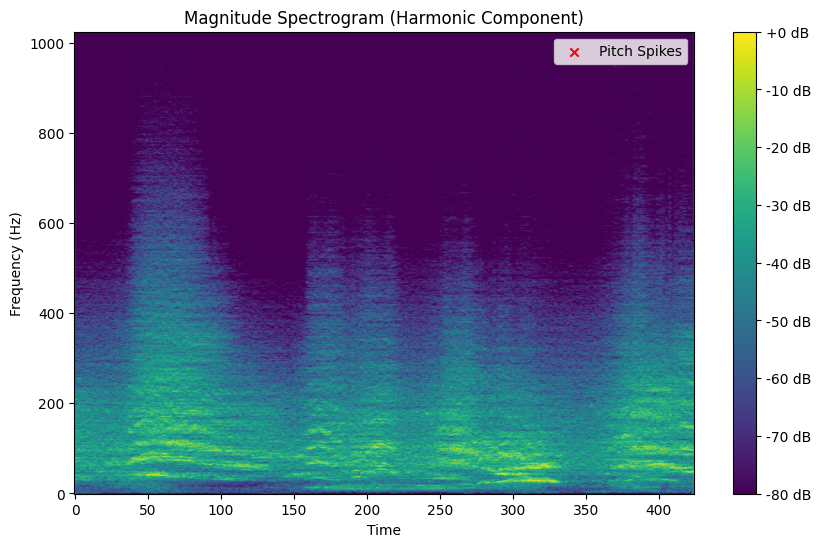

In [ ]:
import librosa
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks

# Replace "audio_example.wav" with the correct file path
PATH = "/content/drive/MyDrive/Project_dataset/Elephant/elephant4.wav"

# Load the audio file using librosa
original_audio, sample_rate = librosa.load(PATH)

# Harmonic-Percussive Source Separation
harmonic, percussive = librosa.effects.hpss(original_audio)

# Compute the magnitude spectrogram of the harmonic component
harmonic_mag = np.abs(librosa.stft(harmonic))

# Find peaks in the harmonic magnitude spectrogram
peaks, _ = find_peaks(harmonic_mag.max(axis=0), height=100)  # You can adjust the height threshold as needed

# Convert peak indices to frequencies
frequencies = librosa.fft_frequencies(sr=sample_rate, n_fft=2048)  # n_fft is the window size used in STFT

# Get the corresponding frequencies for the detected peaks
peak_frequencies = frequencies[peaks]

# Plot the magnitude spectrogram
plt.figure(figsize=(10, 6))
plt.imshow(librosa.amplitude_to_db(harmonic_mag, ref=np.max), origin='lower', aspect='auto', cmap='viridis')
plt.xlabel('Time')
plt.ylabel('Frequency (Hz)')
plt.title('Magnitude Spectrogram (Harmonic Component)')
plt.colorbar(format='%+2.0f dB')

# Plot the peaks on the graph
plt.scatter(peaks, peak_frequencies, color='red', marker='x', label='Pitch Spikes')

plt.legend()
plt.show()

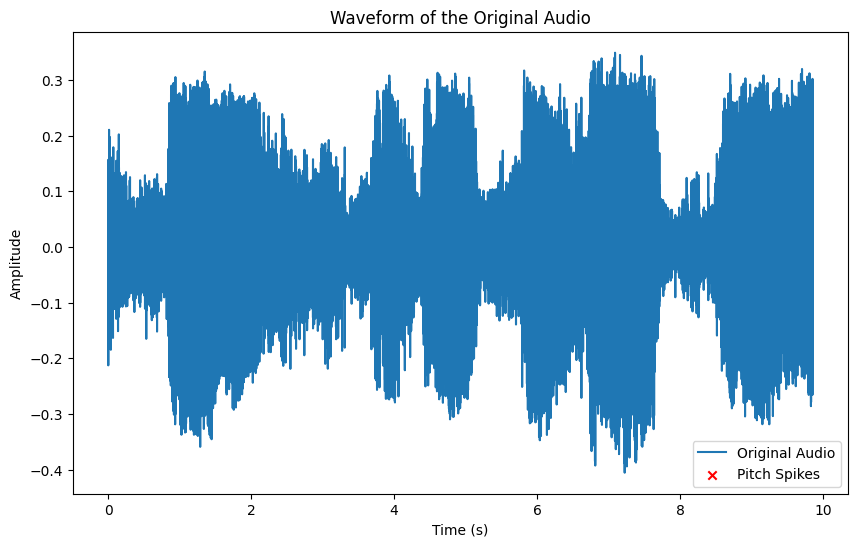

In [ ]:
# Replace "audio_example.wav" with the correct file path
PATH = "/content/drive/MyDrive/Project_dataset/Elephant/elephant4.wav"

# Load the audio file using librosa
original_audio, sample_rate = librosa.load(PATH)

# Harmonic-Percussive Source Separation
harmonic, percussive = librosa.effects.hpss(original_audio)

# Compute the magnitude spectrogram of the harmonic component
harmonic_mag = np.abs(librosa.stft(harmonic))

# Find peaks in the harmonic magnitude spectrogram
peaks, _ = find_peaks(harmonic_mag.max(axis=0), height=100)  # You can adjust the height threshold as needed

# Convert peak indices to time values
times = librosa.times_like(harmonic_mag, sr=sample_rate)  # Time values corresponding to each column in the spectrogram

# Get the corresponding time values for the detected peaks
peak_times = times[peaks]

# Plot the original audio waveform
plt.figure(figsize=(10, 6))
plt.plot(np.arange(len(original_audio)) / sample_rate, original_audio, label='Original Audio')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('Waveform of the Original Audio')

# Plot the pitch spikes on the waveform
plt.scatter(peak_times, original_audio[peaks], color='red', marker='x', label='Pitch Spikes')

plt.legend()
plt.show()

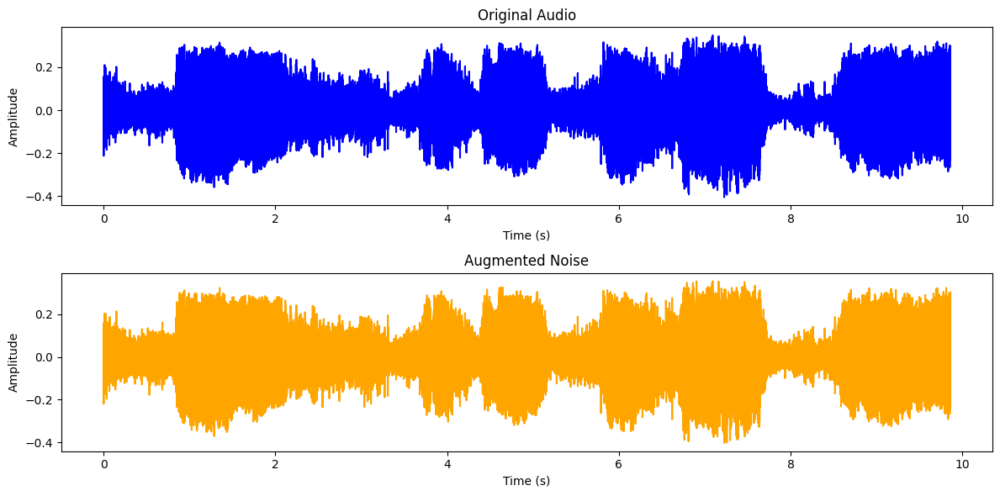

In [ ]:
# Replace "audio_example.wav" with the correct file path
PATH = "/content/drive/MyDrive/Project_dataset/Elephant/elephant4.wav"

# Load the original audio file using librosa
original_audio, sample_rate = librosa.load(PATH)

# Function to apply data augmentation
def augment_audio(audio_data, sample_rate):
    # Your data augmentation code here
    # For example, let's add some random Gaussian noise to the audio
    augmented_audio = audio_data + 0.01 * np.random.randn(len(audio_data))
    return augmented_audio

# Augment the original audio
augmented_audio = augment_audio(original_audio, sample_rate)

# Create a time axis for plotting
time_axis = np.linspace(0, len(original_audio) / sample_rate, len(original_audio))

# Plot the original audio waveform in blue
plt.figure(figsize=(12, 6))
plt.subplot(2, 1, 1)
plt.plot(time_axis, original_audio, color='blue')
plt.title('Original Audio')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')

# Plot the augmented audio waveform in orange
plt.subplot(2, 1, 2)
plt.plot(time_axis, augmented_audio, color='orange')
plt.title('Augmented Noise')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')

plt.tight_layout()
plt.show()


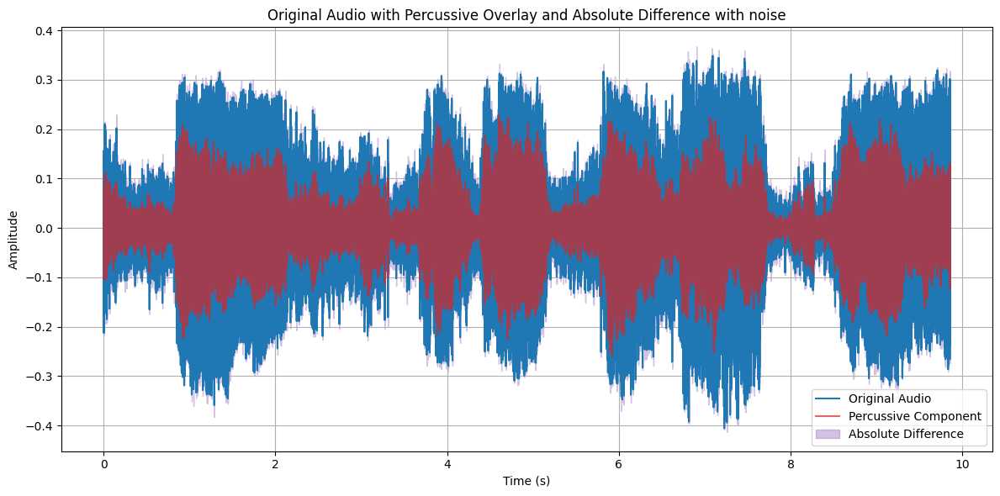

In [ ]:
# Replace with the correct file path
PATH = "/content/drive/MyDrive/Project_dataset/Elephant/elephant4.wav"

# Load the original audio file using librosa
original_audio, sample_rate = librosa.load(PATH)

# Function to apply data augmentation
def augment_audio(audio_data, scale=0.01):
    augmented_audio = audio_data + scale * np.random.randn(len(audio_data))
    return augmented_audio

# Augment the original audio
augmented_audio = augment_audio(original_audio)

# Calculate the absolute difference between the two waveforms
difference = np.abs(augmented_audio - original_audio)

# Create a time axis for plotting
time_axis = np.linspace(0, len(original_audio) / sample_rate, len(original_audio))

# Reference code for displaying multiple waveforms
y_harm, y_perc = librosa.effects.hpss(original_audio)

# Set up color palette
original_color = '#1f77b4'  # Blue
percussive_color = '#d62728'  # Red
difference_color = '#9467bd'  # Purple

# Plot the original audio waveform and the difference
plt.figure(figsize=(12, 6))

# Plot the original audio waveform
plt.plot(time_axis, original_audio, color=original_color, label='Original Audio')

# Overlay the percussive component on the original waveform
plt.plot(time_axis, y_perc, color=percussive_color, label='Percussive Component', alpha=0.7)

# Plot the absolute difference as a shaded region
plt.fill_between(time_axis, original_audio - difference, original_audio + difference, color=difference_color, alpha=0.4, label='Absolute Difference')

plt.title('Original Audio with Percussive Overlay and Absolute Difference with noise')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.legend()
plt.tight_layout()
plt.grid(True)
plt.show()


In [ ]:
# Replace with your input folder path
input_folder_path = "/content/drive/MyDrive/Project_dataset/Elephant"

# Replace with your output folder path
output_folder_path = "/content/drive/MyDrive/ Augmentation/ Noise/ Noise_Elephant"

# Function to apply data augmentation
def augment_audio(audio_data, sample_rate):
    augmented_audio = audio_data + 0.01 * np.random.randn(len(audio_data))
    return augmented_audio

# List all files in the input folder
all_files = os.listdir(input_folder_path)
audio_files = [file for file in all_files if file.endswith(".wav")]

# Ensure the output folder exists
os.makedirs(output_folder_path, exist_ok=True)

# Process each audio file in the folder
for audio_file in audio_files:
    file_path = os.path.join(input_folder_path, audio_file)
    audio_data, sample_rate = librosa.load(file_path)

    augmented_audio = augment_audio(audio_data, sample_rate)

    # Create the output file path in the output folder
    output_file = os.path.splitext(audio_file)[0] + "_augmentednoise.wav"
    output_path = os.path.join(output_folder_path, output_file)

    # Save the augmented audio
    sf.write(output_path, augmented_audio, sample_rate)


### ***Leopard***

In [ ]:
from IPython.display import Audio

# Replace with the correct file path
file_path = "/content/drive/MyDrive/Project_dataset/Leopard/lep1.wav"

# Play the audio
Audio(file_path)


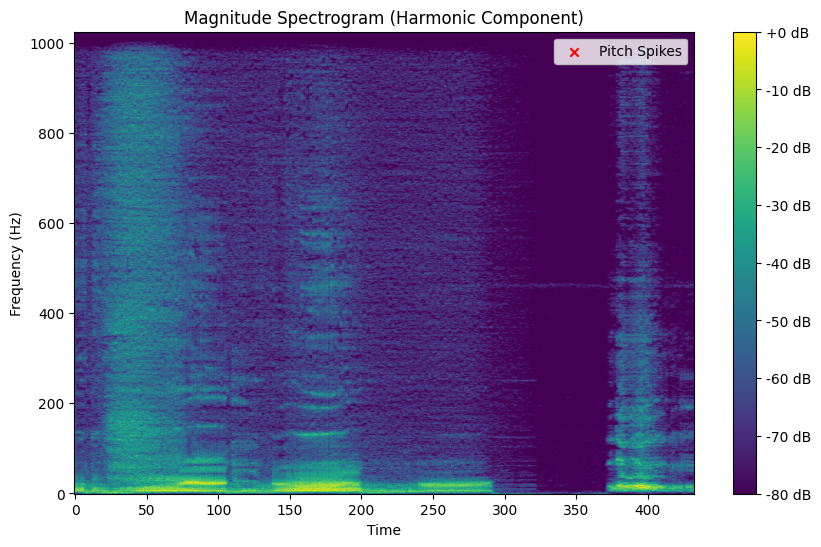

In [ ]:
import librosa
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks

# Replace "audio_example.wav" with the correct file path
PATH = "/content/drive/MyDrive/Project_dataset/Leopard/lep1.wav"

# Load the audio file using librosa
original_audio, sample_rate = librosa.load(PATH)

# Harmonic-Percussive Source Separation
harmonic, percussive = librosa.effects.hpss(original_audio)

# Compute the magnitude spectrogram of the harmonic component
harmonic_mag = np.abs(librosa.stft(harmonic))

# Find peaks in the harmonic magnitude spectrogram
peaks, _ = find_peaks(harmonic_mag.max(axis=0), height=100)  # You can adjust the height threshold as needed

# Convert peak indices to frequencies
frequencies = librosa.fft_frequencies(sr=sample_rate, n_fft=2048)  # n_fft is the window size used in STFT

# Get the corresponding frequencies for the detected peaks
peak_frequencies = frequencies[peaks]

# Plot the magnitude spectrogram
plt.figure(figsize=(10, 6))
plt.imshow(librosa.amplitude_to_db(harmonic_mag, ref=np.max), origin='lower', aspect='auto', cmap='viridis')
plt.xlabel('Time')
plt.ylabel('Frequency (Hz)')
plt.title('Magnitude Spectrogram (Harmonic Component)')
plt.colorbar(format='%+2.0f dB')

# Plot the peaks on the graph
plt.scatter(peaks, peak_frequencies, color='red', marker='x', label='Pitch Spikes')

plt.legend()
plt.show()

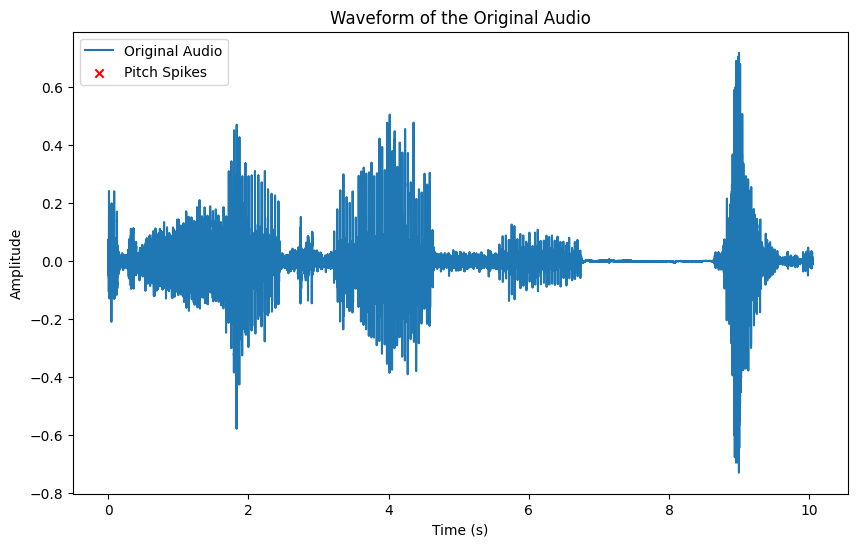

In [ ]:
# Replace "audio_example.wav" with the correct file path
PATH = "/content/drive/MyDrive/Project_dataset/Leopard/lep1.wav"

# Load the audio file using librosa
original_audio, sample_rate = librosa.load(PATH)

# Harmonic-Percussive Source Separation
harmonic, percussive = librosa.effects.hpss(original_audio)

# Compute the magnitude spectrogram of the harmonic component
harmonic_mag = np.abs(librosa.stft(harmonic))

# Find peaks in the harmonic magnitude spectrogram
peaks, _ = find_peaks(harmonic_mag.max(axis=0), height=100)  # You can adjust the height threshold as needed

# Convert peak indices to time values
times = librosa.times_like(harmonic_mag, sr=sample_rate)  # Time values corresponding to each column in the spectrogram

# Get the corresponding time values for the detected peaks
peak_times = times[peaks]

# Plot the original audio waveform
plt.figure(figsize=(10, 6))
plt.plot(np.arange(len(original_audio)) / sample_rate, original_audio, label='Original Audio')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('Waveform of the Original Audio')

# Plot the pitch spikes on the waveform
plt.scatter(peak_times, original_audio[peaks], color='red', marker='x', label='Pitch Spikes')

plt.legend()
plt.show()

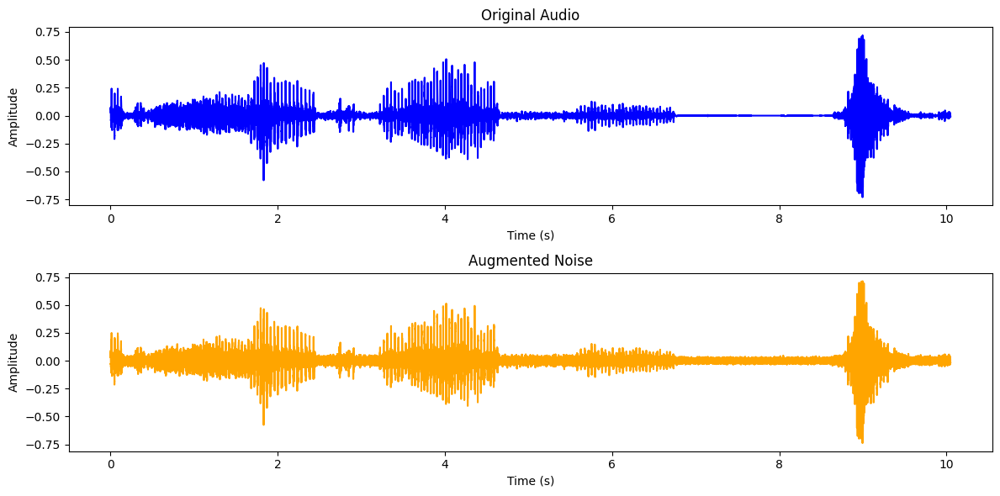

In [ ]:
# Replace "audio_example.wav" with the correct file path
PATH = "/content/drive/MyDrive/Project_dataset/Leopard/lep1.wav"

# Load the original audio file using librosa
original_audio, sample_rate = librosa.load(PATH)

# Function to apply data augmentation
def augment_audio(audio_data, sample_rate):
    # Your data augmentation code here
    # For example, let's add some random Gaussian noise to the audio
    augmented_audio = audio_data + 0.01 * np.random.randn(len(audio_data))
    return augmented_audio

# Augment the original audio
augmented_audio = augment_audio(original_audio, sample_rate)

# Create a time axis for plotting
time_axis = np.linspace(0, len(original_audio) / sample_rate, len(original_audio))

# Plot the original audio waveform in blue
plt.figure(figsize=(12, 6))
plt.subplot(2, 1, 1)
plt.plot(time_axis, original_audio, color='blue')
plt.title('Original Audio')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')

# Plot the augmented audio waveform in orange
plt.subplot(2, 1, 2)
plt.plot(time_axis, augmented_audio, color='orange')
plt.title('Augmented Noise')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')

plt.tight_layout()
plt.show()


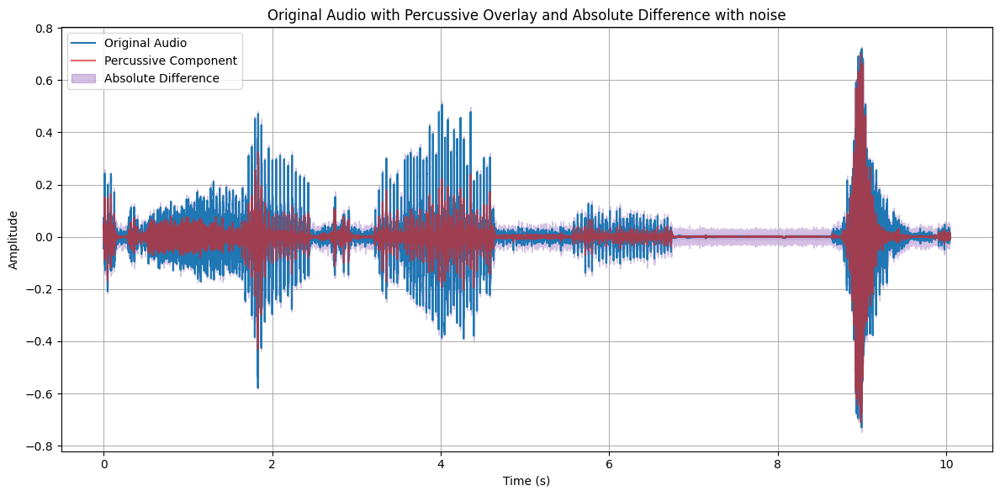

In [ ]:
# Replace with the correct file path
PATH = "/content/drive/MyDrive/Project_dataset/Leopard/lep1.wav"

# Load the original audio file using librosa
original_audio, sample_rate = librosa.load(PATH)

# Function to apply data augmentation
def augment_audio(audio_data, scale=0.01):
    augmented_audio = audio_data + scale * np.random.randn(len(audio_data))
    return augmented_audio

# Augment the original audio
augmented_audio = augment_audio(original_audio)

# Calculate the absolute difference between the two waveforms
difference = np.abs(augmented_audio - original_audio)

# Create a time axis for plotting
time_axis = np.linspace(0, len(original_audio) / sample_rate, len(original_audio))

# Reference code for displaying multiple waveforms
y_harm, y_perc = librosa.effects.hpss(original_audio)

# Set up color palette
original_color = '#1f77b4'  # Blue
percussive_color = '#d62728'  # Red
difference_color = '#9467bd'  # Purple

# Plot the original audio waveform and the difference
plt.figure(figsize=(12, 6))

# Plot the original audio waveform
plt.plot(time_axis, original_audio, color=original_color, label='Original Audio')

# Overlay the percussive component on the original waveform
plt.plot(time_axis, y_perc, color=percussive_color, label='Percussive Component', alpha=0.7)

# Plot the absolute difference as a shaded region
plt.fill_between(time_axis, original_audio - difference, original_audio + difference, color=difference_color, alpha=0.4, label='Absolute Difference')

plt.title('Original Audio with Percussive Overlay and Absolute Difference with noise')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.legend()
plt.tight_layout()
plt.grid(True)
plt.show()


In [ ]:
# Replace with your input folder path
input_folder_path = "/content/drive/MyDrive/Project_dataset/Leopard"

# Replace with your output folder path
output_folder_path = "/content/drive/MyDrive/ Augmentation/ Noise/ Noise_Leopard"

# Function to apply data augmentation
def augment_audio(audio_data, sample_rate):
    augmented_audio = audio_data + 0.01 * np.random.randn(len(audio_data))
    return augmented_audio

# List all files in the input folder
all_files = os.listdir(input_folder_path)
audio_files = [file for file in all_files if file.endswith(".wav")]

# Ensure the output folder exists
os.makedirs(output_folder_path, exist_ok=True)

# Process each audio file in the folder
for audio_file in audio_files:
    file_path = os.path.join(input_folder_path, audio_file)
    audio_data, sample_rate = librosa.load(file_path)

    augmented_audio = augment_audio(audio_data, sample_rate)

    # Create the output file path in the output folder
    output_file = os.path.splitext(audio_file)[0] + "_augmentednoise.wav"
    output_path = os.path.join(output_folder_path, output_file)

    # Save the augmented audio
    sf.write(output_path, augmented_audio, sample_rate)


## ***Otter***

In [ ]:
from IPython.display import Audio

# Replace with the correct file path
file_path = "/content/drive/MyDrive/Project_dataset/Otter/otter1.wav"

# Play the audio
Audio(file_path)


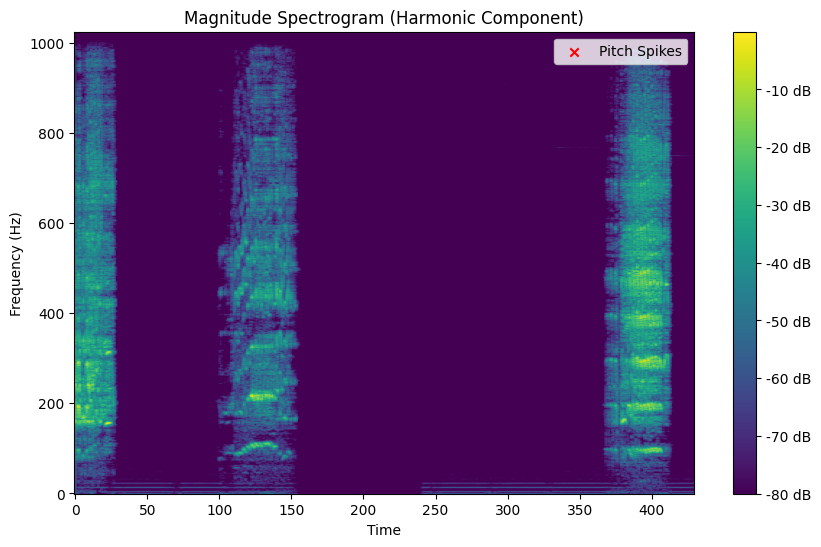

In [ ]:
# Replace "audio_example.wav" with the correct file path
PATH = "/content/drive/MyDrive/Project_dataset/Otter/otter1.wav"

# Load the audio file using librosa
original_audio, sample_rate = librosa.load(PATH)

# Harmonic-Percussive Source Separation
harmonic, percussive = librosa.effects.hpss(original_audio)

# Compute the magnitude spectrogram of the harmonic component
harmonic_mag = np.abs(librosa.stft(harmonic))

# Find peaks in the harmonic magnitude spectrogram
peaks, _ = find_peaks(harmonic_mag.max(axis=0), height=100)  # You can adjust the height threshold as needed

# Convert peak indices to frequencies
frequencies = librosa.fft_frequencies(sr=sample_rate, n_fft=2048)  # n_fft is the window size used in STFT

# Get the corresponding frequencies for the detected peaks
peak_frequencies = frequencies[peaks]

# Plot the magnitude spectrogram
plt.figure(figsize=(10, 6))
plt.imshow(librosa.amplitude_to_db(harmonic_mag, ref=np.max), origin='lower', aspect='auto', cmap='viridis')
plt.xlabel('Time')
plt.ylabel('Frequency (Hz)')
plt.title('Magnitude Spectrogram (Harmonic Component)')
plt.colorbar(format='%+2.0f dB')

# Plot the peaks on the graph
plt.scatter(peaks, peak_frequencies, color='red', marker='x', label='Pitch Spikes')

plt.legend()
plt.show()

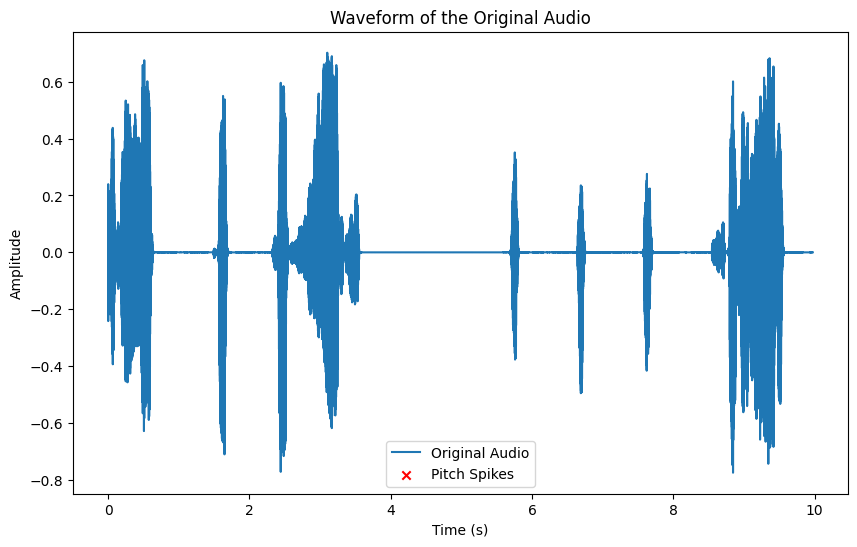

In [ ]:
# Replace "audio_example.wav" with the correct file path
PATH = "/content/drive/MyDrive/Project_dataset/Otter/otter1.wav"

# Load the audio file using librosa
original_audio, sample_rate = librosa.load(PATH)

# Harmonic-Percussive Source Separation
harmonic, percussive = librosa.effects.hpss(original_audio)

# Compute the magnitude spectrogram of the harmonic component
harmonic_mag = np.abs(librosa.stft(harmonic))

# Find peaks in the harmonic magnitude spectrogram
peaks, _ = find_peaks(harmonic_mag.max(axis=0), height=100)  # You can adjust the height threshold as needed

# Convert peak indices to time values
times = librosa.times_like(harmonic_mag, sr=sample_rate)  # Time values corresponding to each column in the spectrogram

# Get the corresponding time values for the detected peaks
peak_times = times[peaks]

# Plot the original audio waveform
plt.figure(figsize=(10, 6))
plt.plot(np.arange(len(original_audio)) / sample_rate, original_audio, label='Original Audio')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('Waveform of the Original Audio')

# Plot the pitch spikes on the waveform
plt.scatter(peak_times, original_audio[peaks], color='red', marker='x', label='Pitch Spikes')

plt.legend()
plt.show()

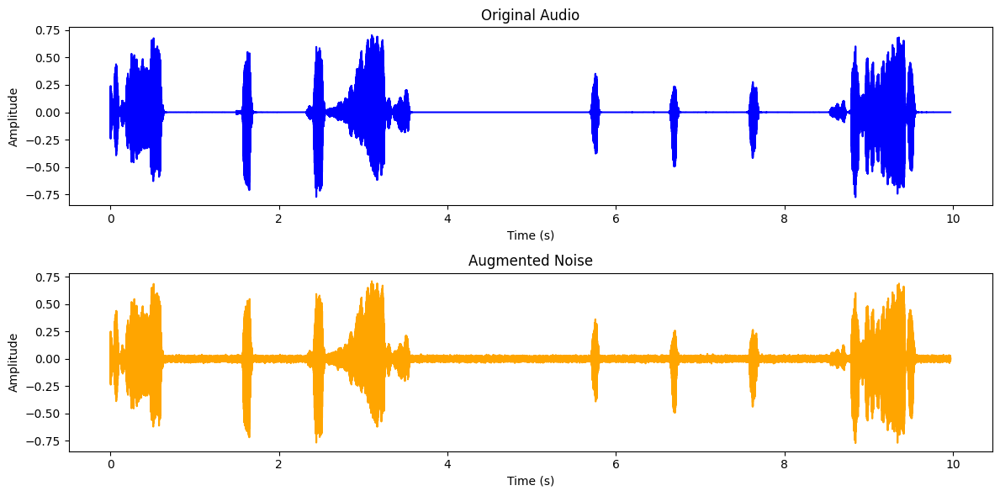

In [ ]:
# Replace "audio_example.wav" with the correct file path
PATH = "/content/drive/MyDrive/Project_dataset/Otter/otter1.wav"

# Load the original audio file using librosa
original_audio, sample_rate = librosa.load(PATH)

# Function to apply data augmentation
def augment_audio(audio_data, sample_rate):
    # Your data augmentation code here
    # For example, let's add some random Gaussian noise to the audio
    augmented_audio = audio_data + 0.01 * np.random.randn(len(audio_data))
    return augmented_audio

# Augment the original audio
augmented_audio = augment_audio(original_audio, sample_rate)

# Create a time axis for plotting
time_axis = np.linspace(0, len(original_audio) / sample_rate, len(original_audio))

# Plot the original audio waveform in blue
plt.figure(figsize=(12, 6))
plt.subplot(2, 1, 1)
plt.plot(time_axis, original_audio, color='blue')
plt.title('Original Audio')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')

# Plot the augmented audio waveform in orange
plt.subplot(2, 1, 2)
plt.plot(time_axis, augmented_audio, color='orange')
plt.title('Augmented Noise')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')

plt.tight_layout()
plt.show()


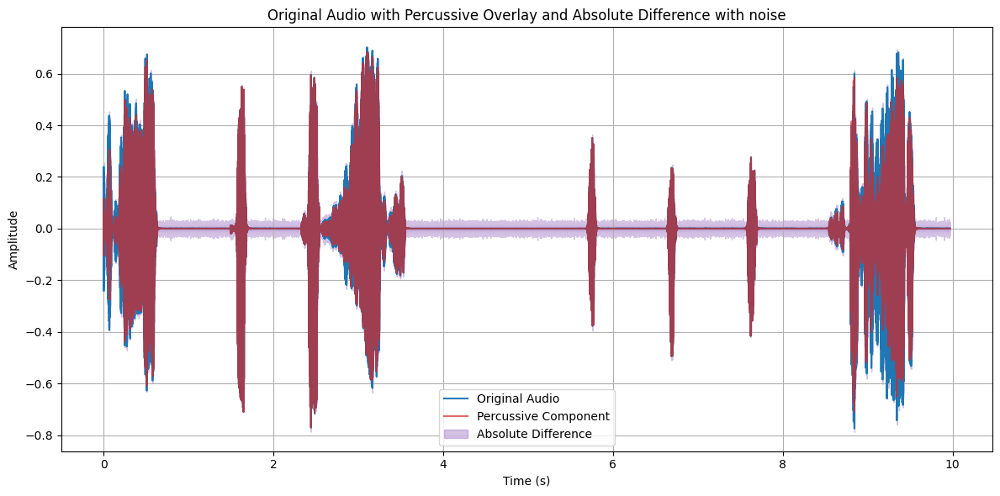

In [ ]:
# Replace with the correct file path
PATH = "/content/drive/MyDrive/Project_dataset/Otter/otter1.wav"

# Load the original audio file using librosa
original_audio, sample_rate = librosa.load(PATH)

# Function to apply data augmentation
def augment_audio(audio_data, scale=0.01):
    augmented_audio = audio_data + scale * np.random.randn(len(audio_data))
    return augmented_audio

# Augment the original audio
augmented_audio = augment_audio(original_audio)

# Calculate the absolute difference between the two waveforms
difference = np.abs(augmented_audio - original_audio)

# Create a time axis for plotting
time_axis = np.linspace(0, len(original_audio) / sample_rate, len(original_audio))

# Reference code for displaying multiple waveforms
y_harm, y_perc = librosa.effects.hpss(original_audio)

# Set up color palette
original_color = '#1f77b4'  # Blue
percussive_color = '#d62728'  # Red
difference_color = '#9467bd'  # Purple

# Plot the original audio waveform and the difference
plt.figure(figsize=(12, 6))

# Plot the original audio waveform
plt.plot(time_axis, original_audio, color=original_color, label='Original Audio')

# Overlay the percussive component on the original waveform
plt.plot(time_axis, y_perc, color=percussive_color, label='Percussive Component', alpha=0.7)

# Plot the absolute difference as a shaded region
plt.fill_between(time_axis, original_audio - difference, original_audio + difference, color=difference_color, alpha=0.4, label='Absolute Difference')

plt.title('Original Audio with Percussive Overlay and Absolute Difference with noise')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.legend()
plt.tight_layout()
plt.grid(True)
plt.show()


In [ ]:
# Replace with your input folder path
input_folder_path = "/content/drive/MyDrive/Project_dataset/Otter"

# Replace with your output folder path
output_folder_path = "/content/drive/MyDrive/ Augmentation/ Noise/ Noise_Otter"

# Function to apply data augmentation
def augment_audio(audio_data, sample_rate):
    augmented_audio = audio_data + 0.01 * np.random.randn(len(audio_data))
    return augmented_audio

# List all files in the input folder
all_files = os.listdir(input_folder_path)
audio_files = [file for file in all_files if file.endswith(".wav")]

# Ensure the output folder exists
os.makedirs(output_folder_path, exist_ok=True)

# Process each audio file in the folder
for audio_file in audio_files:
    file_path = os.path.join(input_folder_path, audio_file)
    audio_data, sample_rate = librosa.load(file_path)

    augmented_audio = augment_audio(audio_data, sample_rate)

    # Create the output file path in the output folder
    output_file = os.path.splitext(audio_file)[0] + "_augmentednoise.wav"
    output_path = os.path.join(output_folder_path, output_file)

    # Save the augmented audio
    sf.write(output_path, augmented_audio, sample_rate)


# **Pitch Shift - Augmentation**

## ***Tiger***

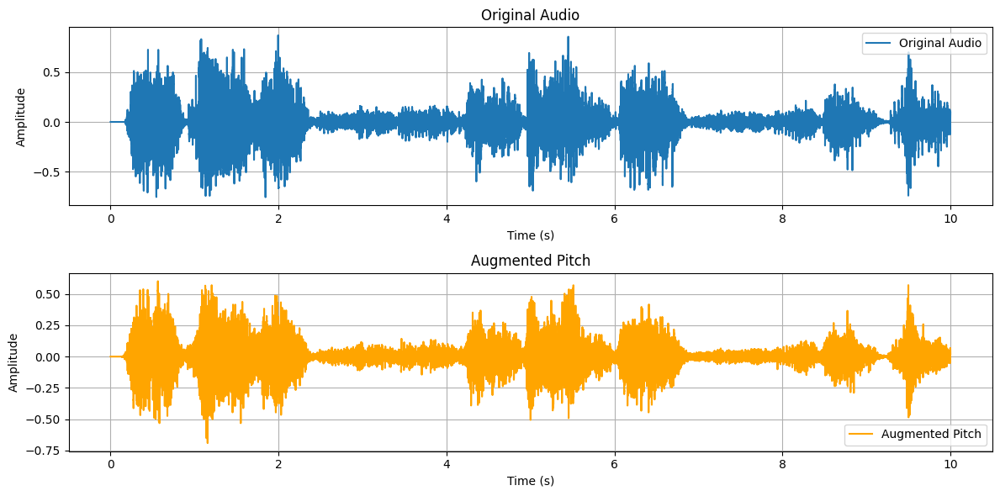

In [ ]:
# Replace with the paths and filenames
input_audio_path = "/content/drive/MyDrive/Project_dataset/Tiger/track 1.wav"

# Load the original audio
original_audio, sample_rate = librosa.load(input_audio_path)

# Function to apply pitch shift augmentation
def augment_pitch(audio_data, pitch_factor, sample_rate):
    n_steps = int(12 * np.log2(pitch_factor))
    augmented_audio = librosa.effects.pitch_shift(audio_data, n_steps=n_steps, sr=sample_rate)
    return augmented_audio

# Apply augmentation
pitch_factor = 1.2  # Adjust the pitch factor as needed
augmented_audio = augment_pitch(original_audio, pitch_factor, sample_rate)

# Create a time axis for plotting
time_axis_original = np.linspace(0, len(original_audio) / sample_rate, len(original_audio))
time_axis_augmented = np.linspace(0, len(augmented_audio) / sample_rate, len(augmented_audio))

# Plot the original audio waveform and the augmented audio waveform
plt.figure(figsize=(12, 6))

# Plot the original audio waveform
plt.subplot(2, 1, 1)
plt.plot(time_axis_original, original_audio, label="Original Audio")
plt.title("Original Audio")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.legend()
plt.grid(True)

# Plot the augmented audio waveform
plt.subplot(2, 1, 2)
plt.plot(time_axis_augmented, augmented_audio, label="Augmented Pitch", color='orange')
plt.title("Augmented Pitch")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


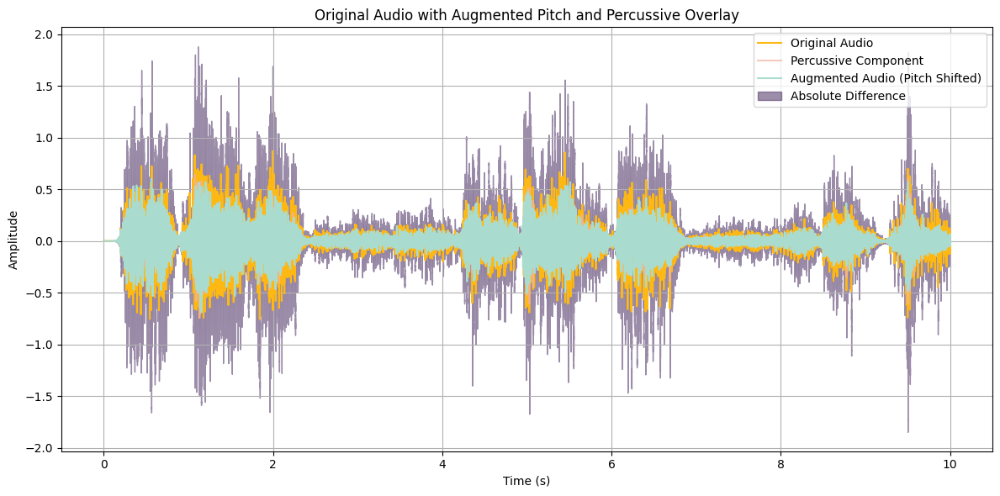

In [ ]:
import librosa
import numpy as np
import matplotlib.pyplot as plt

# Replace with the correct file path
PATH = "/content/drive/MyDrive/Project_dataset/Tiger/track 1.wav"

# Load the original audio file using librosa
original_audio, sample_rate = librosa.load(PATH)

# Function to apply pitch shift augmentation
def augment_pitch(audio_data, pitch_factor):
    n_steps = int(12 * np.log2(pitch_factor))
    augmented_audio = librosa.effects.pitch_shift(audio_data, n_steps=n_steps, sr=sample_rate)
    return augmented_audio

# Define the pitch factor for augmentation
pitch_factor = 1.2

# Augment the original audio
augmented_audio = augment_pitch(original_audio, pitch_factor)

# Calculate the absolute difference between the two waveforms
difference = np.abs(augmented_audio - original_audio)

# Create a time axis for plotting
time_axis = np.linspace(0, len(original_audio) / sample_rate, len(original_audio))

# Reference code for displaying multiple waveforms
y_harm, y_perc = librosa.effects.hpss(original_audio)

# Set up color palette
original_color = '#FDB813'  # Bright yellow for original audio
percussive_color = '#F3B3A6'  # Light red
augmented_color = '#AADBCF'  # Light green
difference_color = '#5A4171'  # Dark purple for difference overlay

# Plot the original audio waveform and the difference
plt.figure(figsize=(12, 6))

# Plot the original audio waveform
plt.plot(time_axis, original_audio, color=original_color, label='Original Audio')

# Overlay the percussive component on the original waveform
plt.plot(time_axis, y_perc, color=percussive_color, label='Percussive Component', alpha=0.7)

# Plot the augmented audio waveform
plt.plot(time_axis, augmented_audio, color=augmented_color, label='Augmented Audio (Pitch Shifted)')

# Plot the absolute difference as a shaded region
plt.fill_between(time_axis, original_audio - difference, original_audio + difference, color=difference_color, alpha=0.6, label='Absolute Difference')

plt.title('Original Audio with Augmented Pitch and Percussive Overlay')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.legend()
plt.tight_layout()
plt.grid(True)
plt.show()


In [ ]:
import os
import librosa
import numpy as np
import soundfile as sf

# Replace with your input folder path
input_folder_path = "/content/drive/MyDrive/Project_dataset/Tiger"

# Replace with your output folder path
output_folder_path = "/content/drive/MyDrive/ Augmentation/ Pitch/ Pitch_Tiger"

# Function to apply pitch shift augmentation
def augment_pitch(audio_data, pitch_factor, sample_rate):
    n_steps = int(12 * np.log2(pitch_factor))
    augmented_audio = librosa.effects.pitch_shift(audio_data, n_steps=n_steps, sr=sample_rate)
    return augmented_audio

# List all files in the input folder
all_files = os.listdir(input_folder_path)
audio_files = [file for file in all_files if file.endswith(".wav")]

# Ensure the output folder exists
os.makedirs(output_folder_path, exist_ok=True)

# Process each audio file in the folder
for audio_file in audio_files:
    file_path = os.path.join(input_folder_path, audio_file)
    audio_data, sample_rate = librosa.load(file_path)

    pitch_factor = 1.2
    augmented_audio = augment_pitch(audio_data, pitch_factor, sample_rate)

    # Create the output file path in the output folder
    output_file = os.path.splitext(audio_file)[0] + "_augmentedpitch.wav"
    output_path = os.path.join(output_folder_path, output_file)

    # Save the augmented audio
    sf.write(output_path, augmented_audio, sample_rate)


## ***Birds***

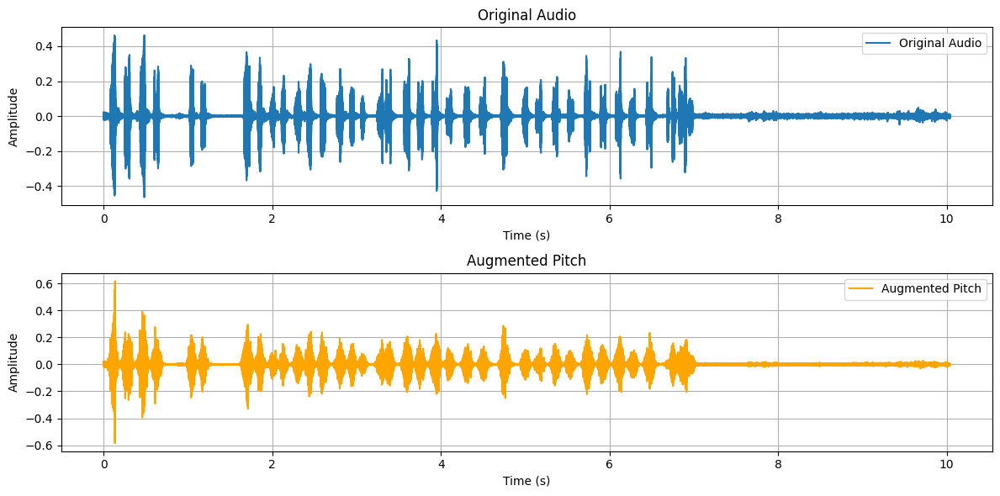

In [ ]:
# Replace with the paths and filenames
input_audio_path = "/content/drive/MyDrive/Project_dataset/Birds/bird1.wav"

# Load the original audio
original_audio, sample_rate = librosa.load(input_audio_path)

# Function to apply pitch shift augmentation
def augment_pitch(audio_data, pitch_factor, sample_rate):
    n_steps = int(12 * np.log2(pitch_factor))
    augmented_audio = librosa.effects.pitch_shift(audio_data, n_steps=n_steps, sr=sample_rate)
    return augmented_audio

# Apply augmentation
pitch_factor = 1.2  # Adjust the pitch factor as needed
augmented_audio = augment_pitch(original_audio, pitch_factor, sample_rate)

# Create a time axis for plotting
time_axis_original = np.linspace(0, len(original_audio) / sample_rate, len(original_audio))
time_axis_augmented = np.linspace(0, len(augmented_audio) / sample_rate, len(augmented_audio))

# Plot the original audio waveform and the augmented audio waveform
plt.figure(figsize=(12, 6))

# Plot the original audio waveform
plt.subplot(2, 1, 1)
plt.plot(time_axis_original, original_audio, label="Original Audio")
plt.title("Original Audio")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.legend()
plt.grid(True)

# Plot the augmented audio waveform
plt.subplot(2, 1, 2)
plt.plot(time_axis_augmented, augmented_audio, label="Augmented Pitch", color='orange')
plt.title("Augmented Pitch")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


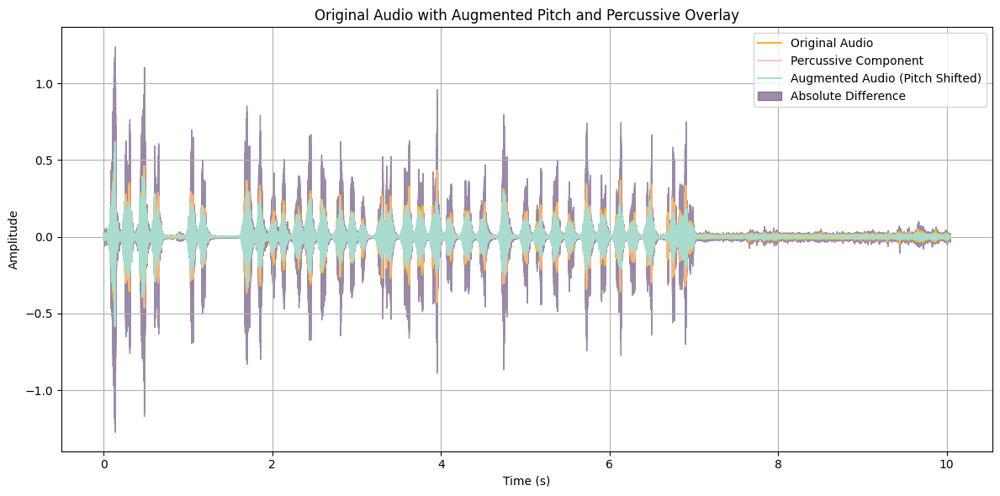

In [ ]:
import librosa
import numpy as np
import matplotlib.pyplot as plt

# Replace with the correct file path
PATH = "/content/drive/MyDrive/Project_dataset/Birds/bird1.wav"

# Load the original audio file using librosa
original_audio, sample_rate = librosa.load(PATH)

# Function to apply pitch shift augmentation
def augment_pitch(audio_data, pitch_factor):
    n_steps = int(12 * np.log2(pitch_factor))
    augmented_audio = librosa.effects.pitch_shift(audio_data, n_steps=n_steps, sr=sample_rate)
    return augmented_audio

# Define the pitch factor for augmentation
pitch_factor = 1.2

# Augment the original audio
augmented_audio = augment_pitch(original_audio, pitch_factor)

# Calculate the absolute difference between the two waveforms
difference = np.abs(augmented_audio - original_audio)

# Create a time axis for plotting
time_axis = np.linspace(0, len(original_audio) / sample_rate, len(original_audio))

# Reference code for displaying multiple waveforms
y_harm, y_perc = librosa.effects.hpss(original_audio)

# Set up color palette
original_color = '#FDB813'  # Bright yellow for original audio
percussive_color = '#F3B3A6'  # Light red
augmented_color = '#AADBCF'  # Light green
difference_color = '#5A4171'  # Dark purple for difference overlay

# Plot the original audio waveform and the difference
plt.figure(figsize=(12, 6))

# Plot the original audio waveform
plt.plot(time_axis, original_audio, color=original_color, label='Original Audio')

# Overlay the percussive component on the original waveform
plt.plot(time_axis, y_perc, color=percussive_color, label='Percussive Component', alpha=0.7)

# Plot the augmented audio waveform
plt.plot(time_axis, augmented_audio, color=augmented_color, label='Augmented Audio (Pitch Shifted)')

# Plot the absolute difference as a shaded region
plt.fill_between(time_axis, original_audio - difference, original_audio + difference, color=difference_color, alpha=0.6, label='Absolute Difference')

plt.title('Original Audio with Augmented Pitch and Percussive Overlay')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.legend()
plt.tight_layout()
plt.grid(True)
plt.show()


In [ ]:
import os
import librosa
import numpy as np
import soundfile as sf

# Replace with your input folder path
input_folder_path = "/content/drive/MyDrive/Project_dataset/Birds"

# Replace with your output folder path
output_folder_path = "/content/drive/MyDrive/ Augmentation/ Pitch/ Pitch_Birds"

# Function to apply pitch shift augmentation
def augment_pitch(audio_data, pitch_factor, sample_rate):
    n_steps = int(12 * np.log2(pitch_factor))
    augmented_audio = librosa.effects.pitch_shift(audio_data, n_steps=n_steps, sr=sample_rate)
    return augmented_audio

# List all files in the input folder
all_files = os.listdir(input_folder_path)
audio_files = [file for file in all_files if file.endswith(".wav")]

# Ensure the output folder exists
os.makedirs(output_folder_path, exist_ok=True)

# Process each audio file in the folder
for audio_file in audio_files:
    file_path = os.path.join(input_folder_path, audio_file)
    audio_data, sample_rate = librosa.load(file_path)

    pitch_factor = 1.2
    augmented_audio = augment_pitch(audio_data, pitch_factor, sample_rate)

    # Create the output file path in the output folder
    output_file = os.path.splitext(audio_file)[0] + "_augmentedpitch.wav"
    output_path = os.path.join(output_folder_path, output_file)

    # Save the augmented audio
    sf.write(output_path, augmented_audio, sample_rate)


## ***Elephant***

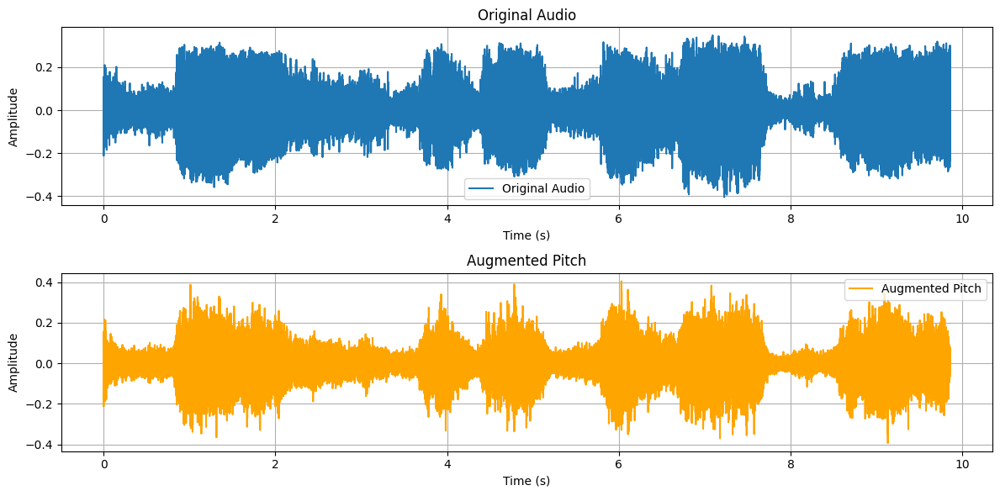

In [ ]:
# Replace with the paths and filenames
input_audio_path = "/content/drive/MyDrive/Project_dataset/Elephant/elephant4.wav"

# Load the original audio
original_audio, sample_rate = librosa.load(input_audio_path)

# Function to apply pitch shift augmentation
def augment_pitch(audio_data, pitch_factor, sample_rate):
    n_steps = int(12 * np.log2(pitch_factor))
    augmented_audio = librosa.effects.pitch_shift(audio_data, n_steps=n_steps, sr=sample_rate)
    return augmented_audio

# Apply augmentation
pitch_factor = 1.2  # Adjust the pitch factor as needed
augmented_audio = augment_pitch(original_audio, pitch_factor, sample_rate)

# Create a time axis for plotting
time_axis_original = np.linspace(0, len(original_audio) / sample_rate, len(original_audio))
time_axis_augmented = np.linspace(0, len(augmented_audio) / sample_rate, len(augmented_audio))

# Plot the original audio waveform and the augmented audio waveform
plt.figure(figsize=(12, 6))

# Plot the original audio waveform
plt.subplot(2, 1, 1)
plt.plot(time_axis_original, original_audio, label="Original Audio")
plt.title("Original Audio")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.legend()
plt.grid(True)

# Plot the augmented audio waveform
plt.subplot(2, 1, 2)
plt.plot(time_axis_augmented, augmented_audio, label="Augmented Pitch", color='orange')
plt.title("Augmented Pitch")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


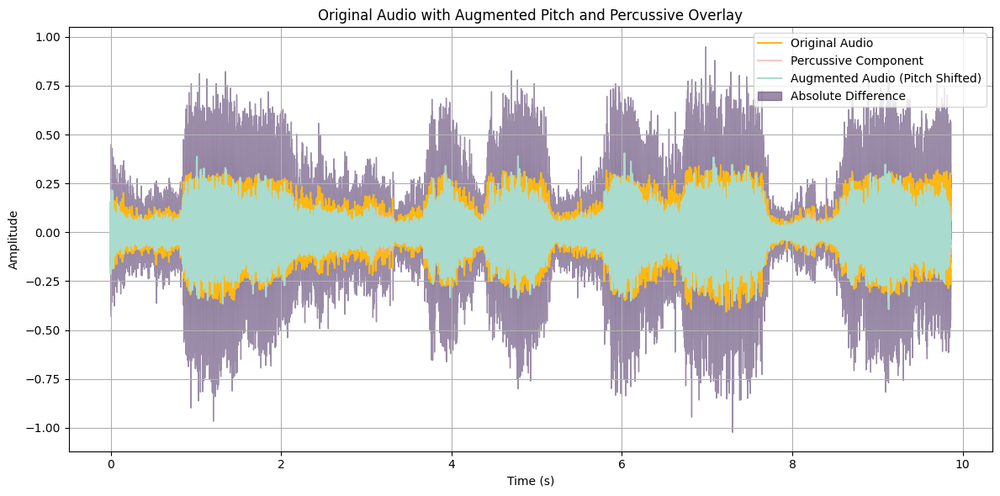

In [ ]:
import librosa
import numpy as np
import matplotlib.pyplot as plt

# Replace with the correct file path
PATH = "/content/drive/MyDrive/Project_dataset/Elephant/elephant4.wav"

# Load the original audio file using librosa
original_audio, sample_rate = librosa.load(PATH)

# Function to apply pitch shift augmentation
def augment_pitch(audio_data, pitch_factor):
    n_steps = int(12 * np.log2(pitch_factor))
    augmented_audio = librosa.effects.pitch_shift(audio_data, n_steps=n_steps, sr=sample_rate)
    return augmented_audio

# Define the pitch factor for augmentation
pitch_factor = 1.2

# Augment the original audio
augmented_audio = augment_pitch(original_audio, pitch_factor)

# Calculate the absolute difference between the two waveforms
difference = np.abs(augmented_audio - original_audio)

# Create a time axis for plotting
time_axis = np.linspace(0, len(original_audio) / sample_rate, len(original_audio))

# Reference code for displaying multiple waveforms
y_harm, y_perc = librosa.effects.hpss(original_audio)

# Set up color palette
original_color = '#FDB813'  # Bright yellow for original audio
percussive_color = '#F3B3A6'  # Light red
augmented_color = '#AADBCF'  # Light green
difference_color = '#5A4171'  # Dark purple for difference overlay

# Plot the original audio waveform and the difference
plt.figure(figsize=(12, 6))

# Plot the original audio waveform
plt.plot(time_axis, original_audio, color=original_color, label='Original Audio')

# Overlay the percussive component on the original waveform
plt.plot(time_axis, y_perc, color=percussive_color, label='Percussive Component', alpha=0.7)

# Plot the augmented audio waveform
plt.plot(time_axis, augmented_audio, color=augmented_color, label='Augmented Audio (Pitch Shifted)')

# Plot the absolute difference as a shaded region
plt.fill_between(time_axis, original_audio - difference, original_audio + difference, color=difference_color, alpha=0.6, label='Absolute Difference')

plt.title('Original Audio with Augmented Pitch and Percussive Overlay')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.legend()
plt.tight_layout()
plt.grid(True)
plt.show()


In [ ]:
import os
import librosa
import numpy as np
import soundfile as sf

# Replace with your input folder path
input_folder_path = "/content/drive/MyDrive/Project_dataset/Elephant"

# Replace with your output folder path
output_folder_path = "/content/drive/MyDrive/ Augmentation/ Pitch/ Pitch_Elephant"

# Function to apply pitch shift augmentation
def augment_pitch(audio_data, pitch_factor, sample_rate):
    n_steps = int(12 * np.log2(pitch_factor))
    augmented_audio = librosa.effects.pitch_shift(audio_data, n_steps=n_steps, sr=sample_rate)
    return augmented_audio

# List all files in the input folder
all_files = os.listdir(input_folder_path)
audio_files = [file for file in all_files if file.endswith(".wav")]

# Ensure the output folder exists
os.makedirs(output_folder_path, exist_ok=True)

# Process each audio file in the folder
for audio_file in audio_files:
    file_path = os.path.join(input_folder_path, audio_file)
    audio_data, sample_rate = librosa.load(file_path)

    pitch_factor = 1.2
    augmented_audio = augment_pitch(audio_data, pitch_factor, sample_rate)

    # Create the output file path in the output folder
    output_file = os.path.splitext(audio_file)[0] + "_augmentedpitch.wav"
    output_path = os.path.join(output_folder_path, output_file)

    # Save the augmented audio
    sf.write(output_path, augmented_audio, sample_rate)


/usr/local/lib/python3.10/dist-packages/librosa/core/spectrum.py:257: UserWarning: n_fft=2048 is too large for input signal of length=0
  warnings.warn(


## ***Leopard***

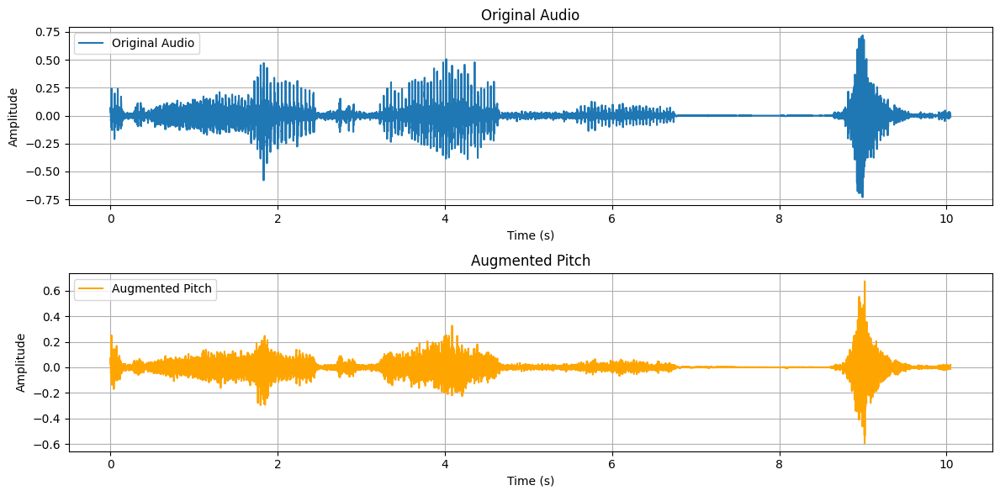

In [ ]:
# Replace with the paths and filenames
input_audio_path = "/content/drive/MyDrive/Project_dataset/Leopard/lep1.wav"

# Load the original audio
original_audio, sample_rate = librosa.load(input_audio_path)

# Function to apply pitch shift augmentation
def augment_pitch(audio_data, pitch_factor, sample_rate):
    n_steps = int(12 * np.log2(pitch_factor))
    augmented_audio = librosa.effects.pitch_shift(audio_data, n_steps=n_steps, sr=sample_rate)
    return augmented_audio

# Apply augmentation
pitch_factor = 1.2  # Adjust the pitch factor as needed
augmented_audio = augment_pitch(original_audio, pitch_factor, sample_rate)

# Create a time axis for plotting
time_axis_original = np.linspace(0, len(original_audio) / sample_rate, len(original_audio))
time_axis_augmented = np.linspace(0, len(augmented_audio) / sample_rate, len(augmented_audio))

# Plot the original audio waveform and the augmented audio waveform
plt.figure(figsize=(12, 6))

# Plot the original audio waveform
plt.subplot(2, 1, 1)
plt.plot(time_axis_original, original_audio, label="Original Audio")
plt.title("Original Audio")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.legend()
plt.grid(True)

# Plot the augmented audio waveform
plt.subplot(2, 1, 2)
plt.plot(time_axis_augmented, augmented_audio, label="Augmented Pitch", color='orange')
plt.title("Augmented Pitch")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


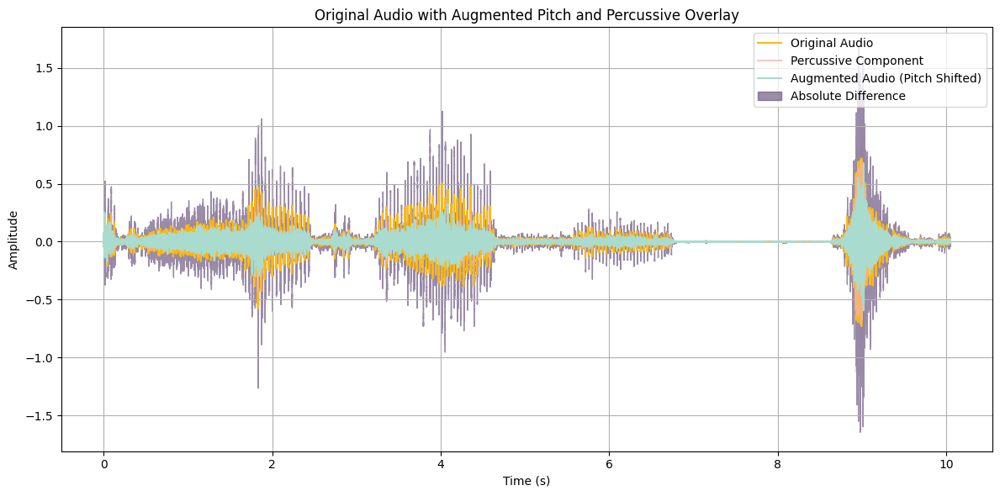

In [ ]:
import librosa
import numpy as np
import matplotlib.pyplot as plt

# Replace with the correct file path
PATH = "/content/drive/MyDrive/Project_dataset/Leopard/lep1.wav"

# Load the original audio file using librosa
original_audio, sample_rate = librosa.load(PATH)

# Function to apply pitch shift augmentation
def augment_pitch(audio_data, pitch_factor):
    n_steps = int(12 * np.log2(pitch_factor))
    augmented_audio = librosa.effects.pitch_shift(audio_data, n_steps=n_steps, sr=sample_rate)
    return augmented_audio

# Define the pitch factor for augmentation
pitch_factor = 1.2

# Augment the original audio
augmented_audio = augment_pitch(original_audio, pitch_factor)

# Calculate the absolute difference between the two waveforms
difference = np.abs(augmented_audio - original_audio)

# Create a time axis for plotting
time_axis = np.linspace(0, len(original_audio) / sample_rate, len(original_audio))

# Reference code for displaying multiple waveforms
y_harm, y_perc = librosa.effects.hpss(original_audio)

# Set up color palette
original_color = '#FDB813'  # Bright yellow for original audio
percussive_color = '#F3B3A6'  # Light red
augmented_color = '#AADBCF'  # Light green
difference_color = '#5A4171'  # Dark purple for difference overlay

# Plot the original audio waveform and the difference
plt.figure(figsize=(12, 6))

# Plot the original audio waveform
plt.plot(time_axis, original_audio, color=original_color, label='Original Audio')

# Overlay the percussive component on the original waveform
plt.plot(time_axis, y_perc, color=percussive_color, label='Percussive Component', alpha=0.7)

# Plot the augmented audio waveform
plt.plot(time_axis, augmented_audio, color=augmented_color, label='Augmented Audio (Pitch Shifted)')

# Plot the absolute difference as a shaded region
plt.fill_between(time_axis, original_audio - difference, original_audio + difference, color=difference_color, alpha=0.6, label='Absolute Difference')

plt.title('Original Audio with Augmented Pitch and Percussive Overlay')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.legend()
plt.tight_layout()
plt.grid(True)
plt.show()


In [ ]:
import os
import librosa
import numpy as np
import soundfile as sf

# Replace with your input folder path
input_folder_path = "/content/drive/MyDrive/Project_dataset/Leopard"

# Replace with your output folder path
output_folder_path = "/content/drive/MyDrive/ Augmentation/ Pitch/ Pitch_Leopard"

# Function to apply pitch shift augmentation
def augment_pitch(audio_data, pitch_factor, sample_rate):
    n_steps = int(12 * np.log2(pitch_factor))
    augmented_audio = librosa.effects.pitch_shift(audio_data, n_steps=n_steps, sr=sample_rate)
    return augmented_audio

# List all files in the input folder
all_files = os.listdir(input_folder_path)
audio_files = [file for file in all_files if file.endswith(".wav")]

# Ensure the output folder exists
os.makedirs(output_folder_path, exist_ok=True)

# Process each audio file in the folder
for audio_file in audio_files:
    file_path = os.path.join(input_folder_path, audio_file)
    audio_data, sample_rate = librosa.load(file_path)

    pitch_factor = 1.2
    augmented_audio = augment_pitch(audio_data, pitch_factor, sample_rate)

    # Create the output file path in the output folder
    output_file = os.path.splitext(audio_file)[0] + "_augmentedpitch.wav"
    output_path = os.path.join(output_folder_path, output_file)

    # Save the augmented audio
    sf.write(output_path, augmented_audio, sample_rate)


## ***Otter***

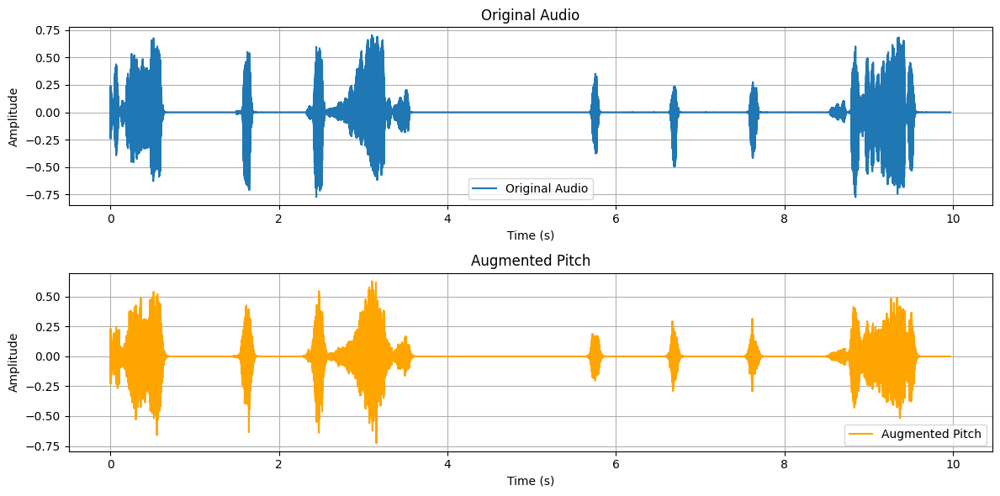

In [ ]:
# Replace with the paths and filenames
input_audio_path = "/content/drive/MyDrive/Project_dataset/Otter/otter1.wav"

# Load the original audio
original_audio, sample_rate = librosa.load(input_audio_path)

# Function to apply pitch shift augmentation
def augment_pitch(audio_data, pitch_factor, sample_rate):
    n_steps = int(12 * np.log2(pitch_factor))
    augmented_audio = librosa.effects.pitch_shift(audio_data, n_steps=n_steps, sr=sample_rate)
    return augmented_audio

# Apply augmentation
pitch_factor = 1.2  # Adjust the pitch factor as needed
augmented_audio = augment_pitch(original_audio, pitch_factor, sample_rate)

# Create a time axis for plotting
time_axis_original = np.linspace(0, len(original_audio) / sample_rate, len(original_audio))
time_axis_augmented = np.linspace(0, len(augmented_audio) / sample_rate, len(augmented_audio))

# Plot the original audio waveform and the augmented audio waveform
plt.figure(figsize=(12, 6))

# Plot the original audio waveform
plt.subplot(2, 1, 1)
plt.plot(time_axis_original, original_audio, label="Original Audio")
plt.title("Original Audio")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.legend()
plt.grid(True)

# Plot the augmented audio waveform
plt.subplot(2, 1, 2)
plt.plot(time_axis_augmented, augmented_audio, label="Augmented Pitch", color='orange')
plt.title("Augmented Pitch")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


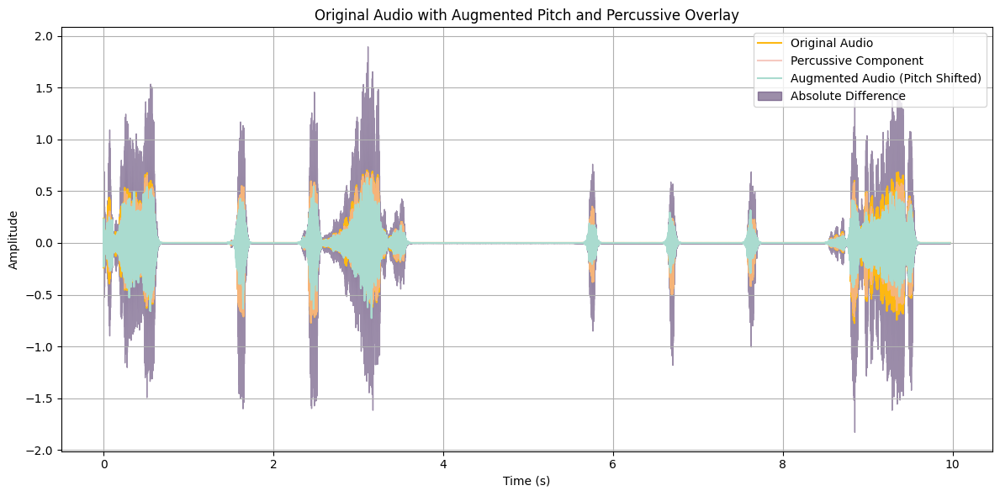

In [ ]:
import librosa
import numpy as np
import matplotlib.pyplot as plt

# Replace with the correct file path
PATH = "/content/drive/MyDrive/Project_dataset/Otter/otter1.wav"

# Load the original audio file using librosa
original_audio, sample_rate = librosa.load(PATH)

# Function to apply pitch shift augmentation
def augment_pitch(audio_data, pitch_factor):
    n_steps = int(12 * np.log2(pitch_factor))
    augmented_audio = librosa.effects.pitch_shift(audio_data, n_steps=n_steps, sr=sample_rate)
    return augmented_audio

# Define the pitch factor for augmentation
pitch_factor = 1.2

# Augment the original audio
augmented_audio = augment_pitch(original_audio, pitch_factor)

# Calculate the absolute difference between the two waveforms
difference = np.abs(augmented_audio - original_audio)

# Create a time axis for plotting
time_axis = np.linspace(0, len(original_audio) / sample_rate, len(original_audio))

# Reference code for displaying multiple waveforms
y_harm, y_perc = librosa.effects.hpss(original_audio)

# Set up color palette
original_color = '#FDB813'  # Bright yellow for original audio
percussive_color = '#F3B3A6'  # Light red
augmented_color = '#AADBCF'  # Light green
difference_color = '#5A4171'  # Dark purple for difference overlay

# Plot the original audio waveform and the difference
plt.figure(figsize=(12, 6))

# Plot the original audio waveform
plt.plot(time_axis, original_audio, color=original_color, label='Original Audio')

# Overlay the percussive component on the original waveform
plt.plot(time_axis, y_perc, color=percussive_color, label='Percussive Component', alpha=0.7)

# Plot the augmented audio waveform
plt.plot(time_axis, augmented_audio, color=augmented_color, label='Augmented Audio (Pitch Shifted)')

# Plot the absolute difference as a shaded region
plt.fill_between(time_axis, original_audio - difference, original_audio + difference, color=difference_color, alpha=0.6, label='Absolute Difference')

plt.title('Original Audio with Augmented Pitch and Percussive Overlay')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.legend()
plt.tight_layout()
plt.grid(True)
plt.show()


In [ ]:
import os
import librosa
import numpy as np
import soundfile as sf

# Replace with your input folder path
input_folder_path = "/content/drive/MyDrive/Project_dataset/Otter"

# Replace with your output folder path
output_folder_path = "/content/drive/MyDrive/ Augmentation/ Pitch/ Pitch_Otter"

# Function to apply pitch shift augmentation
def augment_pitch(audio_data, pitch_factor, sample_rate):
    n_steps = int(12 * np.log2(pitch_factor))
    augmented_audio = librosa.effects.pitch_shift(audio_data, n_steps=n_steps, sr=sample_rate)
    return augmented_audio

# List all files in the input folder
all_files = os.listdir(input_folder_path)
audio_files = [file for file in all_files if file.endswith(".wav")]

# Ensure the output folder exists
os.makedirs(output_folder_path, exist_ok=True)

# Process each audio file in the folder
for audio_file in audio_files:
    file_path = os.path.join(input_folder_path, audio_file)
    audio_data, sample_rate = librosa.load(file_path)

    pitch_factor = 1.2
    augmented_audio = augment_pitch(audio_data, pitch_factor, sample_rate)

    # Create the output file path in the output folder
    output_file = os.path.splitext(audio_file)[0] + "_augmentedpitch.wav"
    output_path = os.path.join(output_folder_path, output_file)

    # Save the augmented audio
    sf.write(output_path, augmented_audio, sample_rate)


# **Reverberation**

## ***Tiger***

In [ ]:
!pip install pydub


In [ ]:
import os
from pydub import AudioSegment
import random

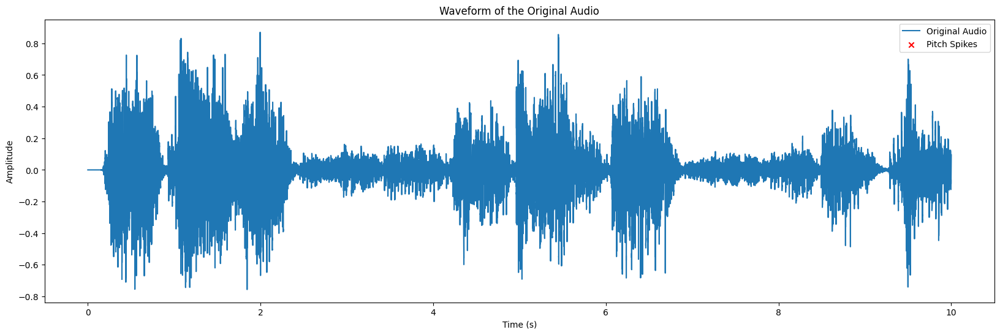

In [ ]:
# Replace "audio_example.wav" with the correct file path
PATH = "/content/drive/MyDrive/Project_dataset/Tiger/track 1.wav"

# Load the audio file using librosa
original_audio, sample_rate = librosa.load(PATH)

# Harmonic-Percussive Source Separation
harmonic, percussive = librosa.effects.hpss(original_audio)

# Compute the magnitude spectrogram of the harmonic component
harmonic_mag = np.abs(librosa.stft(harmonic))

# Find peaks in the harmonic magnitude spectrogram
peaks, _ = find_peaks(harmonic_mag.max(axis=0), height=100)  # You can adjust the height threshold as needed

# Convert peak indices to time values
times = librosa.times_like(harmonic_mag, sr=sample_rate)  # Time values corresponding to each column in the spectrogram

# Get the corresponding time values for the detected peaks
peak_times = times[peaks]

# Plot the original audio waveform
plt.figure(figsize=(20, 6))
plt.plot(np.arange(len(original_audio)) / sample_rate, original_audio, label='Original Audio')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('Waveform of the Original Audio')

# Plot the pitch spikes on the waveform
plt.scatter(peak_times, original_audio[peaks], color='red', marker='x', label='Pitch Spikes')

plt.legend()
plt.show()

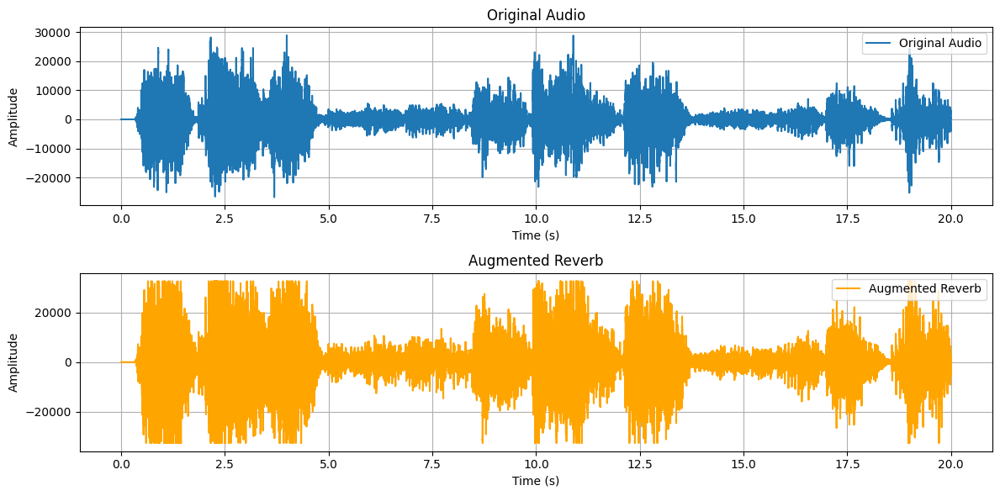

In [ ]:
# Replace with the path to your input audio file
input_audio_path = "/content/drive/MyDrive/Project_dataset/Tiger/track 1.wav"

# Load the original audio using pydub
original_audio = AudioSegment.from_file(input_audio_path)

# Function to apply reverb augmentation
def augment_reverb(audio, reverb_level, decay_time_ms):
    # Apply reverb effect
    reverb = audio
    for _ in range(reverb_level):
        reverb = reverb.overlay(audio, position=random.randint(0, decay_time_ms))
    return reverb

# Define the reverb parameters
reverb_level = 2  # Adjust the reverb level as needed
decay_time_ms = 100  # Adjust the decay time as needed

# Apply reverb augmentation
augmented_audio = augment_reverb(original_audio, reverb_level, decay_time_ms)

# Convert the AudioSegment objects to NumPy arrays
original_audio_array = np.array(original_audio.get_array_of_samples())
augmented_audio_array = np.array(augmented_audio.get_array_of_samples())

# Create a time axis for plotting
time_axis = np.arange(len(original_audio_array)) / original_audio.frame_rate

# Compute the difference between the original and augmented audio
difference_audio_array = augmented_audio_array - original_audio_array

# Plot the original audio waveform and the augmented audio waveform
plt.figure(figsize=(12, 6))

# Plot the original audio waveform
plt.subplot(2, 1, 1)
plt.plot(time_axis, original_audio_array, label="Original Audio")
plt.title("Original Audio")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.legend()
plt.grid(True)

# Plot the augmented audio waveform
plt.subplot(2, 1, 2)
plt.plot(time_axis, augmented_audio_array, label="Augmented Reverb", color='orange')
plt.title("Augmented Reverb")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


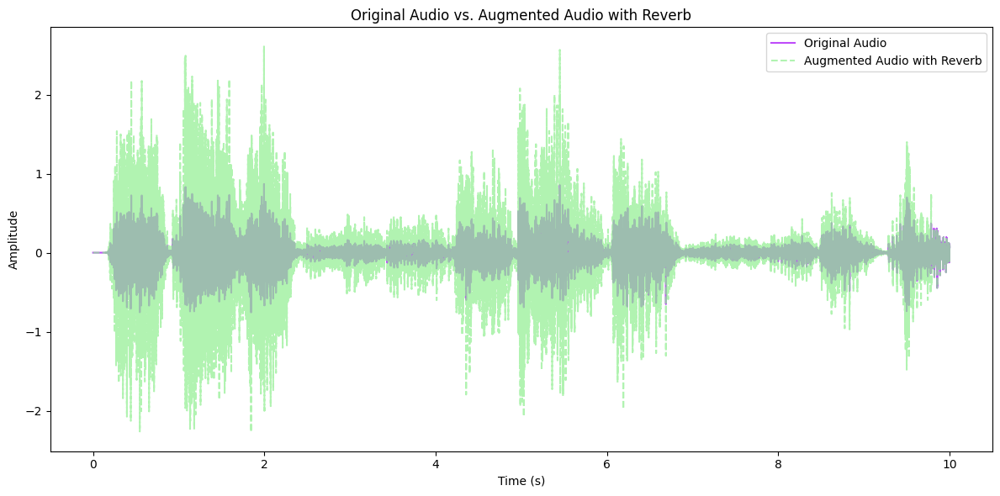

In [ ]:
import librosa
import numpy as np
import matplotlib.pyplot as plt

# Replace with the correct file path
PATH = "/content/drive/MyDrive/Project_dataset/Tiger/track 1.wav"

# Load the original audio file using librosa
original_audio, sample_rate = librosa.load(PATH)

# Function to apply reverberation augmentation
def augment_reverb(audio_data, reverb_level, decay_time_ms):
    augmented_audio = audio_data.copy()
    for _ in range(reverb_level):
        # Randomly select a position to overlay the original audio
        position = np.random.randint(0, len(audio_data))
        reverb_segment = audio_data[:position]  # Take the audio before the position
        reverb_segment = np.pad(reverb_segment, (0, len(audio_data) - position), mode='constant')
        augmented_audio += reverb_segment
    return augmented_audio

# Define the reverb parameters
reverb_level = 2  # Adjust the reverb level as needed
decay_time_ms = 100  # Adjust the decay time as needed

# Augment the original audio with reverb
augmented_audio = augment_reverb(original_audio, reverb_level, decay_time_ms)

# Create a time axis for plotting
time_axis = np.linspace(0, len(original_audio) / sample_rate, len(original_audio))

# Plot the original audio and the augmented audio with reverb overlaid on each other
plt.figure(figsize=(12, 6))

# Plot the original audio in a light purple with a solid line
plt.plot(time_axis, original_audio, color='#A300F9', label='Original Audio', linestyle='solid', alpha=0.7)

# Plot the augmented audio with reverb in a lighter green with a dashed line and reduced opacity
plt.plot(time_axis, augmented_audio, color='#90EE90', label='Augmented Audio with Reverb', linestyle='dashed', alpha=0.7)

# Set labels and legend
plt.title('Original Audio vs. Augmented Audio with Reverb')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')

plt.tight_layout()
plt.show()


In [ ]:
import soundfile as sf

# Replace with your input folder path
input_folder_path = "/content/drive/MyDrive/Project_dataset/Tiger"

# Replace with your output folder path
output_folder_path = "/content/drive/MyDrive/ Augmentation/ Reverberation/  Reverb_Tiger"

# Define the reverb parameters
reverb_level = 2  # Adjust the reverb level as needed
decay_time_ms = 100  # Adjust the decay time as needed

# Function to apply reverberation augmentation
def augment_reverb(audio_data, reverb_level, decay_time_ms, sample_rate):
    augmented_audio = audio_data.copy()
    for _ in range(reverb_level):
        reverb_duration = int((decay_time_ms / 1000) * sample_rate)
        reverb_segment = np.random.normal(0, 0.02, reverb_duration)  #Gaussian noise as reverb
        augmented_audio[:reverb_duration] += reverb_segment
    return augmented_audio

# List all files in the input folder
all_files = os.listdir(input_folder_path)
audio_files = [file for file in all_files if file.endswith(".wav")]

# Ensure the output folder exists
os.makedirs(output_folder_path, exist_ok=True)

# Process each audio file in the folder
for audio_file in audio_files:
    file_path = os.path.join(input_folder_path, audio_file)
    audio_data, sample_rate = librosa.load(file_path)

    augmented_audio = augment_reverb(audio_data, reverb_level, decay_time_ms, sample_rate)

    # Create the output file path in the output folder
    output_file = os.path.splitext(audio_file)[0] + "_augmentedreverb.wav"
    output_path = os.path.join(output_folder_path, output_file)

    # Save the augmented audio
    sf.write(output_path, augmented_audio, sample_rate)


## ***Birds***

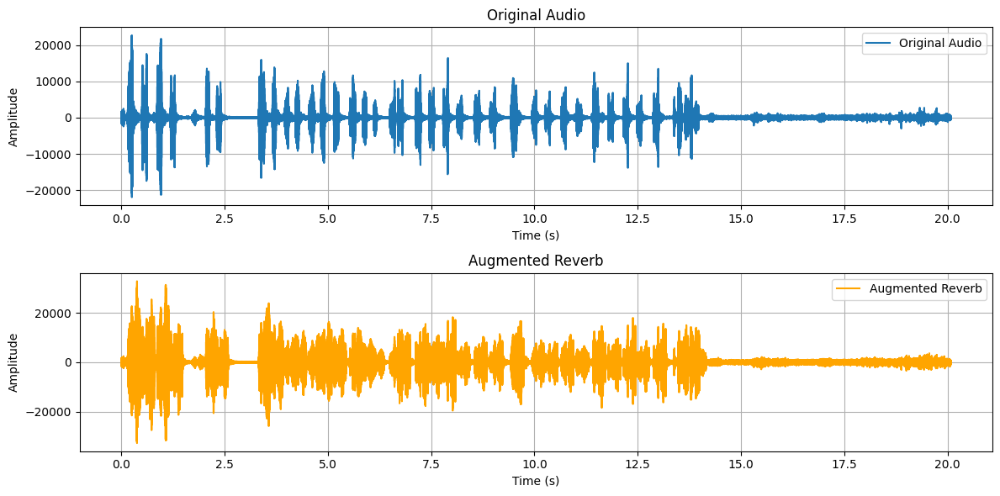

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from pydub import AudioSegment
import random

# Replace with the path to your input audio file
input_audio_path = "/content/drive/MyDrive/Project_dataset/Birds/bird1.wav"

# Load the original audio using pydub
original_audio = AudioSegment.from_file(input_audio_path)

# Function to apply reverb augmentation
def augment_reverb(audio, reverb_level, decay_time_ms):
    # Apply reverb effect
    reverb = audio
    for _ in range(reverb_level):
        reverb = reverb.overlay(audio, position=random.randint(0, decay_time_ms))
    return reverb

# Define the reverb parameters
reverb_level = 2  # Adjust the reverb level as needed
decay_time_ms = 100  # Adjust the decay time as needed

# Apply reverb augmentation
augmented_audio = augment_reverb(original_audio, reverb_level, decay_time_ms)

# Convert the AudioSegment objects to NumPy arrays
original_audio_array = np.array(original_audio.get_array_of_samples())
augmented_audio_array = np.array(augmented_audio.get_array_of_samples())

# Calculate the length of the shorter array
min_length = min(len(original_audio_array), len(augmented_audio_array))

# Compute the difference between the original and augmented audio up to the length of the shorter array
difference_audio_array = augmented_audio_array[:min_length] - original_audio_array[:min_length]

# Create a time axis for plotting based on the length of the shorter array
time_axis = np.arange(min_length) / original_audio.frame_rate

# Plot the original audio waveform and the augmented audio waveform
plt.figure(figsize=(12, 6))

# Plot the original audio waveform
plt.subplot(2, 1, 1)
plt.plot(time_axis, original_audio_array[:min_length], label="Original Audio")
plt.title("Original Audio")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.legend()
plt.grid(True)

# Plot the augmented audio waveform
plt.subplot(2, 1, 2)
plt.plot(time_axis, augmented_audio_array[:min_length], label="Augmented Reverb", color='orange')
plt.title("Augmented Reverb")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


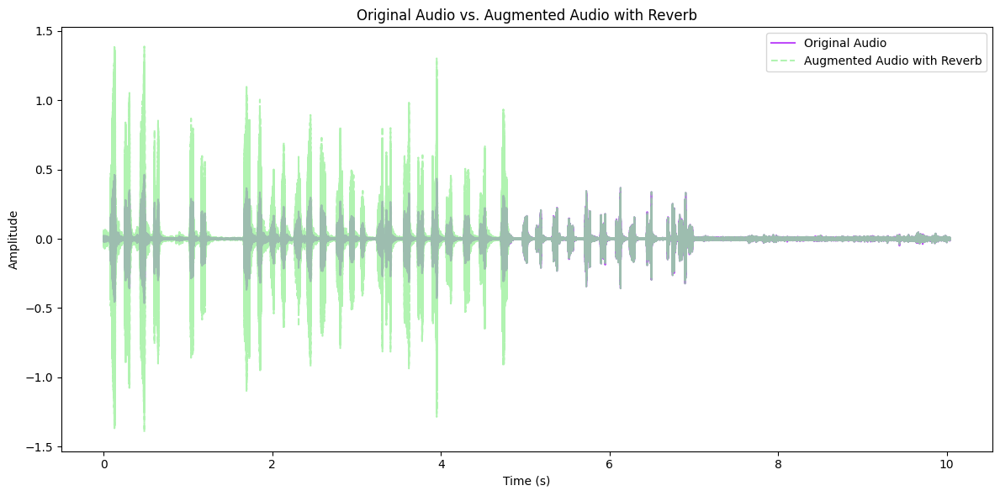

In [ ]:
import librosa
import numpy as np
import matplotlib.pyplot as plt

# Replace with the correct file path
PATH = "/content/drive/MyDrive/Project_dataset/Birds/bird1.wav"

# Load the original audio file using librosa
original_audio, sample_rate = librosa.load(PATH)

# Function to apply reverberation augmentation
def augment_reverb(audio_data, reverb_level, decay_time_ms):
    augmented_audio = audio_data.copy()
    for _ in range(reverb_level):
        # Randomly select a position to overlay the original audio
        position = np.random.randint(0, len(audio_data))
        reverb_segment = audio_data[:position]  # Take the audio before the position
        reverb_segment = np.pad(reverb_segment, (0, len(audio_data) - position), mode='constant')
        augmented_audio += reverb_segment
    return augmented_audio

# Define the reverb parameters
reverb_level = 2  # Adjust the reverb level as needed
decay_time_ms = 100  # Adjust the decay time as needed

# Augment the original audio with reverb
augmented_audio = augment_reverb(original_audio, reverb_level, decay_time_ms)

# Create a time axis for plotting
time_axis = np.linspace(0, len(original_audio) / sample_rate, len(original_audio))

# Plot the original audio and the augmented audio with reverb overlaid on each other
plt.figure(figsize=(12, 6))

# Plot the original audio in a light purple with a solid line
plt.plot(time_axis, original_audio, color='#A300F9', label='Original Audio', linestyle='solid', alpha=0.7)

# Plot the augmented audio with reverb in a lighter green with a dashed line and reduced opacity
plt.plot(time_axis, augmented_audio, color='#90EE90', label='Augmented Audio with Reverb', linestyle='dashed', alpha=0.7)

# Set labels and legend
plt.title('Original Audio vs. Augmented Audio with Reverb')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')

plt.tight_layout()
plt.show()


In [ ]:
import soundfile as sf

# Replace with your input folder path
input_folder_path = "/content/drive/MyDrive/Project_dataset/Birds"

# Replace with your output folder path
output_folder_path = "/content/drive/MyDrive/ Augmentation/ Reverberation/ Reverb_Birds"

# Define the reverb parameters
reverb_level = 2  # Adjust the reverb level as needed
decay_time_ms = 100  # Adjust the decay time as needed

# Function to apply reverberation augmentation
def augment_reverb(audio_data, reverb_level, decay_time_ms, sample_rate):
    augmented_audio = audio_data.copy()
    for _ in range(reverb_level):
        reverb_duration = int((decay_time_ms / 1000) * sample_rate)
        reverb_segment = np.random.normal(0, 0.02, reverb_duration)  #Gaussian noise as reverb
        augmented_audio[:reverb_duration] += reverb_segment
    return augmented_audio

# List all files in the input folder
all_files = os.listdir(input_folder_path)
audio_files = [file for file in all_files if file.endswith(".wav")]

# Ensure the output folder exists
os.makedirs(output_folder_path, exist_ok=True)

# Process each audio file in the folder
for audio_file in audio_files:
    file_path = os.path.join(input_folder_path, audio_file)
    audio_data, sample_rate = librosa.load(file_path)

    augmented_audio = augment_reverb(audio_data, reverb_level, decay_time_ms, sample_rate)

    # Create the output file path in the output folder
    output_file = os.path.splitext(audio_file)[0] + "_augmentedreverb.wav"
    output_path = os.path.join(output_folder_path, output_file)

    # Save the augmented audio
    sf.write(output_path, augmented_audio, sample_rate)


## ***Elephant***

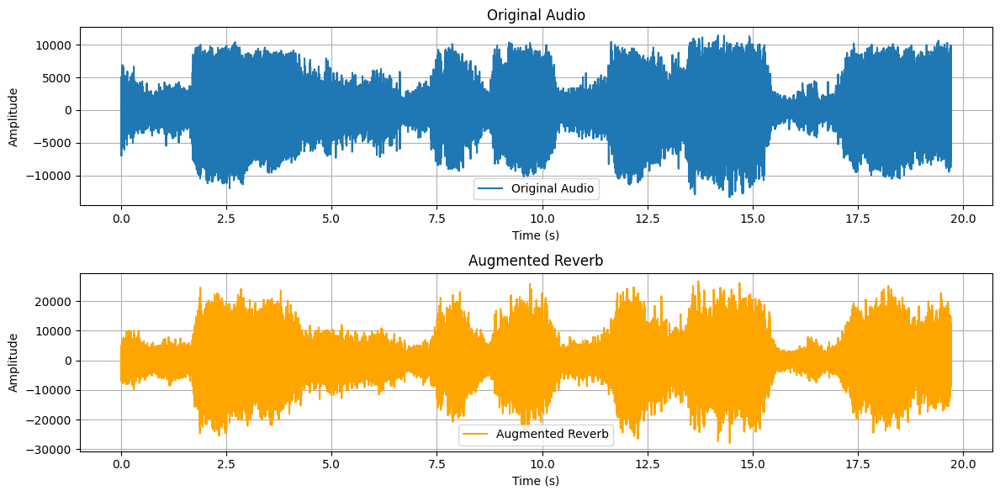

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from pydub import AudioSegment
import random

# Replace with the path to your input audio file
input_audio_path = "/content/drive/MyDrive/Project_dataset/Elephant/elephant4.wav"

# Load the original audio using pydub
original_audio = AudioSegment.from_file(input_audio_path)

# Function to apply reverb augmentation
def augment_reverb(audio, reverb_level, decay_time_ms):
    # Apply reverb effect
    reverb = audio
    for _ in range(reverb_level):
        reverb = reverb.overlay(audio, position=random.randint(0, decay_time_ms))
    return reverb

# Define the reverb parameters
reverb_level = 2  # Adjust the reverb level as needed
decay_time_ms = 100  # Adjust the decay time as needed

# Apply reverb augmentation
augmented_audio = augment_reverb(original_audio, reverb_level, decay_time_ms)

# Convert the AudioSegment objects to NumPy arrays
original_audio_array = np.array(original_audio.get_array_of_samples())
augmented_audio_array = np.array(augmented_audio.get_array_of_samples())

# Calculate the length of the shorter array
min_length = min(len(original_audio_array), len(augmented_audio_array))

# Compute the difference between the original and augmented audio up to the length of the shorter array
difference_audio_array = augmented_audio_array[:min_length] - original_audio_array[:min_length]

# Create a time axis for plotting based on the length of the shorter array
time_axis = np.arange(min_length) / original_audio.frame_rate

# Plot the original audio waveform and the augmented audio waveform
plt.figure(figsize=(12, 6))

# Plot the original audio waveform
plt.subplot(2, 1, 1)
plt.plot(time_axis, original_audio_array[:min_length], label="Original Audio")
plt.title("Original Audio")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.legend()
plt.grid(True)

# Plot the augmented audio waveform
plt.subplot(2, 1, 2)
plt.plot(time_axis, augmented_audio_array[:min_length], label="Augmented Reverb", color='orange')
plt.title("Augmented Reverb")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


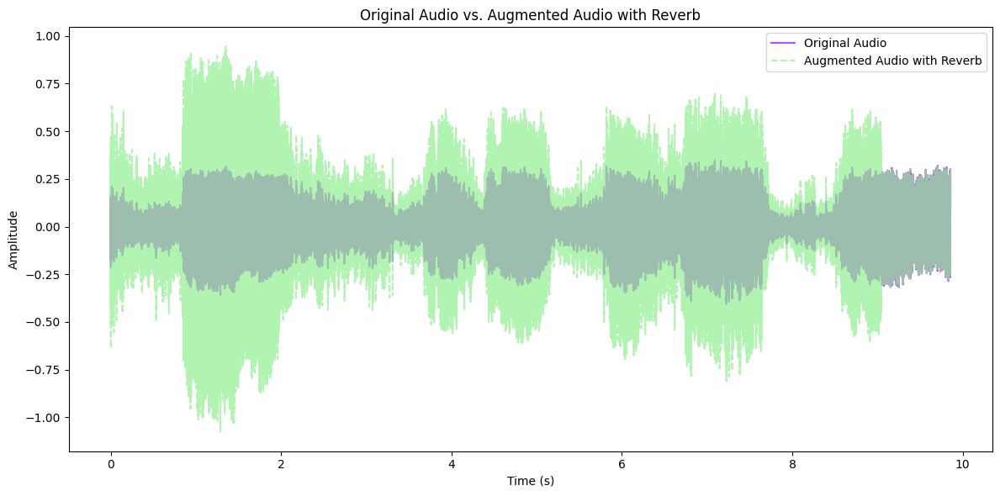

In [ ]:
import librosa
import numpy as np
import matplotlib.pyplot as plt

# Set a fixed seed for reproducibility
np.random.seed(0)

# Replace with the correct file path
PATH = "/content/drive/MyDrive/Project_dataset/Elephant/elephant4.wav"

# Load the original audio file using librosa
original_audio, sample_rate = librosa.load(PATH)

# Function to apply reverberation augmentation
def augment_reverb(audio_data, reverb_level, decay_time_ms):
    augmented_audio = audio_data.copy()
    for _ in range(reverb_level):
        # Randomly select a position to overlay the original audio
        position = np.random.randint(0, len(audio_data))
        reverb_segment = audio_data[:position]  # Take the audio before the position
        reverb_segment = np.pad(reverb_segment, (0, len(audio_data) - position), mode='constant')
        augmented_audio += reverb_segment
    return augmented_audio

# Define the reverb parameters
reverb_level = 2  # Adjust the reverb level as needed
decay_time_ms = 100  # Adjust the decay time as needed

# Augment the original audio with reverb
augmented_audio = augment_reverb(original_audio, reverb_level, decay_time_ms)

# Create a time axis for plotting
time_axis = np.linspace(0, len(original_audio) / sample_rate, len(original_audio))

# Plot the original audio and the augmented audio with reverb overlaid on each other
plt.figure(figsize=(12, 6))

# Plot the original audio in a light purple with a solid line
plt.plot(time_axis, original_audio, color='#A300F9', label='Original Audio', linestyle='solid', alpha=0.7)

# Plot the augmented audio with reverb in a lighter green with a dashed line and reduced opacity
plt.plot(time_axis, augmented_audio, color='#90EE90', label='Augmented Audio with Reverb', linestyle='dashed', alpha=0.7)

# Set labels and legend
plt.title('Original Audio vs. Augmented Audio with Reverb')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')

plt.tight_layout()
plt.show()


In [ ]:
import soundfile as sf

# Replace with your input folder path
input_folder_path = "/content/drive/MyDrive/Project_dataset/Elephant"

# Replace with your output folder path
output_folder_path = "/content/drive/MyDrive/ Augmentation/ Reverberation/Reverb_Elephant"

# Define the reverb parameters
reverb_level = 2  # Adjust the reverb level as needed
decay_time_ms = 100  # Adjust the decay time as needed

# Function to apply reverberation augmentation
def augment_reverb(audio_data, reverb_level, decay_time_ms, sample_rate):
    augmented_audio = audio_data.copy()
    for _ in range(reverb_level):
        reverb_duration = int((decay_time_ms / 1000) * sample_rate)

        # Check if reverb duration is within valid range
        if 0 < reverb_duration <= len(augmented_audio):
            reverb_segment = np.random.normal(0, 0.02, reverb_duration)  # Gaussian noise as reverb
            augmented_audio[:reverb_duration] += reverb_segment
    return augmented_audio

# List all files in the input folder
all_files = os.listdir(input_folder_path)
audio_files = [file for file in all_files if file.endswith(".wav")]

# Ensure the output folder exists
os.makedirs(output_folder_path, exist_ok=True)

# Process each audio file in the folder
for audio_file in audio_files:
    file_path = os.path.join(input_folder_path, audio_file)
    audio_data, sample_rate = librosa.load(file_path)

    augmented_audio = augment_reverb(audio_data, reverb_level, decay_time_ms, sample_rate)

    # Create the output file path in the output folder
    output_file = os.path.splitext(audio_file)[0] + "_augmentedreverb.wav"
    output_path = os.path.join(output_folder_path, output_file)

    # Save the augmented audio
    sf.write(output_path, augmented_audio, sample_rate)


## ***Leopard***

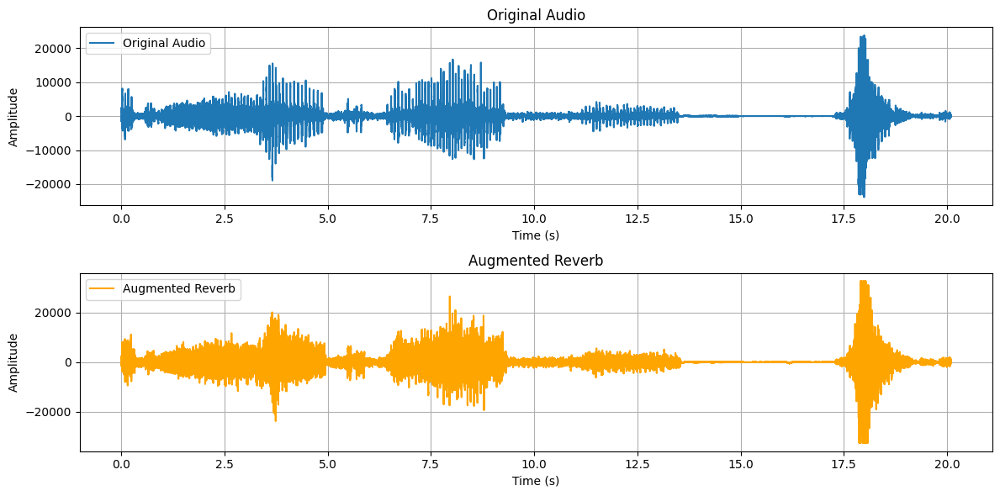

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from pydub import AudioSegment
import random

# Replace with the path to your input audio file
input_audio_path = "/content/drive/MyDrive/Project_dataset/Leopard/lep1.wav"

# Load the original audio using pydub
original_audio = AudioSegment.from_file(input_audio_path)

# Function to apply reverb augmentation
def augment_reverb(audio, reverb_level, decay_time_ms):
    # Apply reverb effect
    reverb = audio
    for _ in range(reverb_level):
        reverb = reverb.overlay(audio, position=random.randint(0, decay_time_ms))
    return reverb

# Define the reverb parameters
reverb_level = 2  # Adjust the reverb level as needed
decay_time_ms = 100  # Adjust the decay time as needed

# Apply reverb augmentation
augmented_audio = augment_reverb(original_audio, reverb_level, decay_time_ms)

# Convert the AudioSegment objects to NumPy arrays
original_audio_array = np.array(original_audio.get_array_of_samples())
augmented_audio_array = np.array(augmented_audio.get_array_of_samples())

# Calculate the length of the shorter array
min_length = min(len(original_audio_array), len(augmented_audio_array))

# Compute the difference between the original and augmented audio up to the length of the shorter array
difference_audio_array = augmented_audio_array[:min_length] - original_audio_array[:min_length]

# Create a time axis for plotting based on the length of the shorter array
time_axis = np.arange(min_length) / original_audio.frame_rate

# Plot the original audio waveform and the augmented audio waveform
plt.figure(figsize=(12, 6))

# Plot the original audio waveform
plt.subplot(2, 1, 1)
plt.plot(time_axis, original_audio_array[:min_length], label="Original Audio")
plt.title("Original Audio")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.legend()
plt.grid(True)

# Plot the augmented audio waveform
plt.subplot(2, 1, 2)
plt.plot(time_axis, augmented_audio_array[:min_length], label="Augmented Reverb", color='orange')
plt.title("Augmented Reverb")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


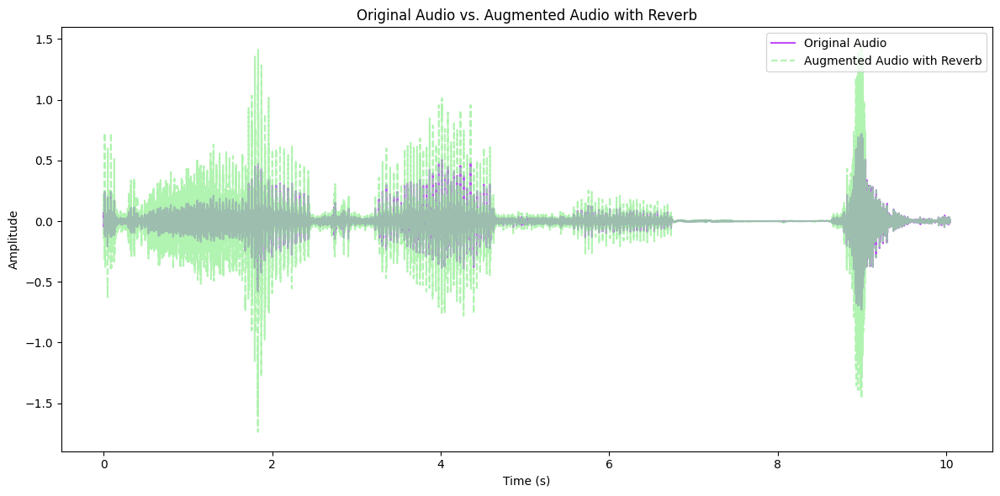

In [ ]:
import librosa
import numpy as np
import matplotlib.pyplot as plt

# Set a fixed seed for reproducibility
np.random.seed(0)

# Replace with the correct file path
PATH = "/content/drive/MyDrive/Project_dataset/Leopard/lep1.wav"

# Load the original audio file using librosa
original_audio, sample_rate = librosa.load(PATH)

# Function to apply reverberation augmentation
def augment_reverb(audio_data, reverb_level, decay_time_ms):
    augmented_audio = audio_data.copy()
    for _ in range(reverb_level):
        # Randomly select a position to overlay the original audio
        position = np.random.randint(0, len(audio_data))
        reverb_segment = audio_data[:position]  # Take the audio before the position
        reverb_segment = np.pad(reverb_segment, (0, len(audio_data) - position), mode='constant')
        augmented_audio += reverb_segment
    return augmented_audio

# Define the reverb parameters
reverb_level = 2  # Adjust the reverb level as needed
decay_time_ms = 100  # Adjust the decay time as needed

# Augment the original audio with reverb
augmented_audio = augment_reverb(original_audio, reverb_level, decay_time_ms)

# Create a time axis for plotting
time_axis = np.linspace(0, len(original_audio) / sample_rate, len(original_audio))

# Plot the original audio and the augmented audio with reverb overlaid on each other
plt.figure(figsize=(12, 6))

# Plot the original audio in a light purple with a solid line
plt.plot(time_axis, original_audio, color='#A300F9', label='Original Audio', linestyle='solid', alpha=0.7)

# Plot the augmented audio with reverb in a lighter green with a dashed line and reduced opacity
plt.plot(time_axis, augmented_audio, color='#90EE90', label='Augmented Audio with Reverb', linestyle='dashed', alpha=0.7)

# Set labels and legend
plt.title('Original Audio vs. Augmented Audio with Reverb')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')

plt.tight_layout()
plt.show()


In [ ]:
import soundfile as sf

# Replace with your input folder path
input_folder_path = "/content/drive/MyDrive/Project_dataset/Leopard"

# Replace with your output folder path
output_folder_path = "/content/drive/MyDrive/ Augmentation/ Reverberation/ Reverb_Leopard"

# Define the reverb parameters
reverb_level = 2  # Adjust the reverb level as needed
decay_time_ms = 100  # Adjust the decay time as needed

# Function to apply reverberation augmentation
def augment_reverb(audio_data, reverb_level, decay_time_ms, sample_rate):
    augmented_audio = audio_data.copy()
    for _ in range(reverb_level):
        reverb_duration = int((decay_time_ms / 1000) * sample_rate)

        # Check if reverb duration is within valid range
        if 0 < reverb_duration <= len(augmented_audio):
            reverb_segment = np.random.normal(0, 0.02, reverb_duration)  # Gaussian noise as reverb
            augmented_audio[:reverb_duration] += reverb_segment
    return augmented_audio

# List all files in the input folder
all_files = os.listdir(input_folder_path)
audio_files = [file for file in all_files if file.endswith(".wav")]

# Ensure the output folder exists
os.makedirs(output_folder_path, exist_ok=True)

# Process each audio file in the folder
for audio_file in audio_files:
    file_path = os.path.join(input_folder_path, audio_file)
    audio_data, sample_rate = librosa.load(file_path)

    augmented_audio = augment_reverb(audio_data, reverb_level, decay_time_ms, sample_rate)

    # Create the output file path in the output folder
    output_file = os.path.splitext(audio_file)[0] + "_augmentedreverb.wav"
    output_path = os.path.join(output_folder_path, output_file)

    # Save the augmented audio
    sf.write(output_path, augmented_audio, sample_rate)


## ***Otter***

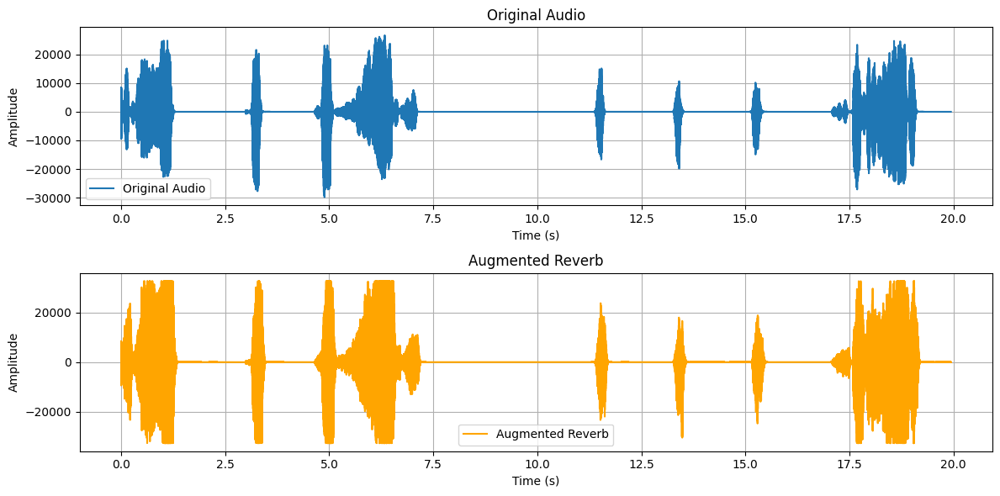

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from pydub import AudioSegment
import random

# Replace with the path to your input audio file
input_audio_path = "/content/drive/MyDrive/Project_dataset/Otter/otter1.wav"

# Load the original audio using pydub
original_audio = AudioSegment.from_file(input_audio_path)

# Function to apply reverb augmentation
def augment_reverb(audio, reverb_level, decay_time_ms):
    # Apply reverb effect
    reverb = audio
    for _ in range(reverb_level):
        reverb = reverb.overlay(audio, position=random.randint(0, decay_time_ms))
    return reverb

# Define the reverb parameters
reverb_level = 2  # Adjust the reverb level as needed
decay_time_ms = 100  # Adjust the decay time as needed

# Apply reverb augmentation
augmented_audio = augment_reverb(original_audio, reverb_level, decay_time_ms)

# Convert the AudioSegment objects to NumPy arrays
original_audio_array = np.array(original_audio.get_array_of_samples())
augmented_audio_array = np.array(augmented_audio.get_array_of_samples())

# Calculate the length of the shorter array
min_length = min(len(original_audio_array), len(augmented_audio_array))

# Compute the difference between the original and augmented audio up to the length of the shorter array
difference_audio_array = augmented_audio_array[:min_length] - original_audio_array[:min_length]

# Create a time axis for plotting based on the length of the shorter array
time_axis = np.arange(min_length) / original_audio.frame_rate

# Plot the original audio waveform and the augmented audio waveform
plt.figure(figsize=(12, 6))

# Plot the original audio waveform
plt.subplot(2, 1, 1)
plt.plot(time_axis, original_audio_array[:min_length], label="Original Audio")
plt.title("Original Audio")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.legend()
plt.grid(True)

# Plot the augmented audio waveform
plt.subplot(2, 1, 2)
plt.plot(time_axis, augmented_audio_array[:min_length], label="Augmented Reverb", color='orange')
plt.title("Augmented Reverb")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


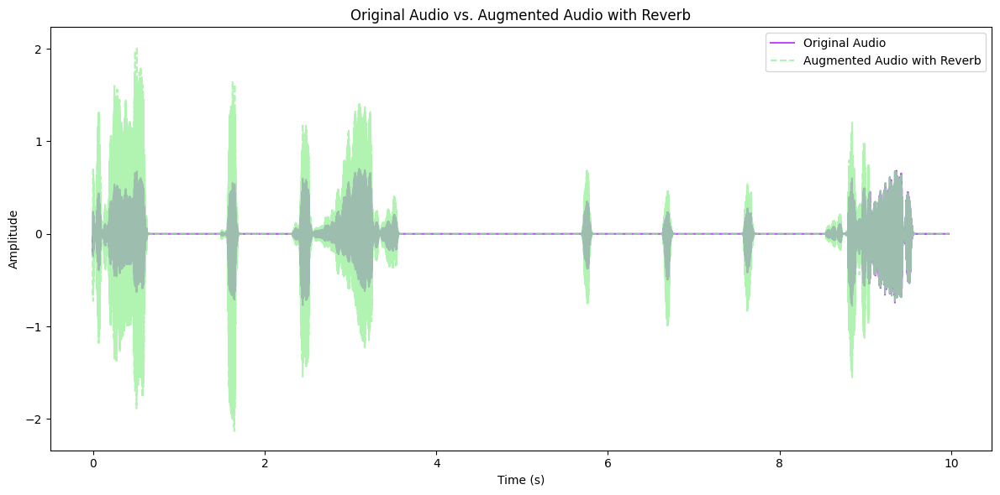

In [ ]:
import librosa
import numpy as np
import matplotlib.pyplot as plt

# Set a fixed seed for reproducibility
np.random.seed(0)

# Replace with the correct file path
PATH = "/content/drive/MyDrive/Project_dataset/Otter/otter1.wav"

# Load the original audio file using librosa
original_audio, sample_rate = librosa.load(PATH)

# Function to apply reverberation augmentation
def augment_reverb(audio_data, reverb_level, decay_time_ms):
    augmented_audio = audio_data.copy()
    for _ in range(reverb_level):
        # Randomly select a position to overlay the original audio
        position = np.random.randint(0, len(audio_data))
        reverb_segment = audio_data[:position]  # Take the audio before the position
        reverb_segment = np.pad(reverb_segment, (0, len(audio_data) - position), mode='constant')
        augmented_audio += reverb_segment
    return augmented_audio

# Define the reverb parameters
reverb_level = 2  # Adjust the reverb level as needed
decay_time_ms = 100  # Adjust the decay time as needed

# Augment the original audio with reverb
augmented_audio = augment_reverb(original_audio, reverb_level, decay_time_ms)

# Create a time axis for plotting
time_axis = np.linspace(0, len(original_audio) / sample_rate, len(original_audio))

# Plot the original audio and the augmented audio with reverb overlaid on each other
plt.figure(figsize=(12, 6))

# Plot the original audio in a light purple with a solid line
plt.plot(time_axis, original_audio, color='#A300F9', label='Original Audio', linestyle='solid', alpha=0.7)

# Plot the augmented audio with reverb in a lighter green with a dashed line and reduced opacity
plt.plot(time_axis, augmented_audio, color='#90EE90', label='Augmented Audio with Reverb', linestyle='dashed', alpha=0.7)

# Set labels and legend
plt.title('Original Audio vs. Augmented Audio with Reverb')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')

plt.tight_layout()
plt.show()


In [ ]:
import soundfile as sf

# Replace with your input folder path
input_folder_path = "/content/drive/MyDrive/Project_dataset/Otter"

# Replace with your output folder path
output_folder_path = "/content/drive/MyDrive/ Augmentation/ Reverberation/  Reverb_Otter"

# Define the reverb parameters
reverb_level = 2  # Adjust the reverb level as needed
decay_time_ms = 100  # Adjust the decay time as needed

# Function to apply reverberation augmentation
def augment_reverb(audio_data, reverb_level, decay_time_ms, sample_rate):
    augmented_audio = audio_data.copy()
    for _ in range(reverb_level):
        reverb_duration = int((decay_time_ms / 1000) * sample_rate)

        # Check if reverb duration is within valid range
        if 0 < reverb_duration <= len(augmented_audio):
            reverb_segment = np.random.normal(0, 0.02, reverb_duration)  # Gaussian noise as reverb
            augmented_audio[:reverb_duration] += reverb_segment
    return augmented_audio

# List all files in the input folder
all_files = os.listdir(input_folder_path)
audio_files = [file for file in all_files if file.endswith(".wav")]

# Ensure the output folder exists
os.makedirs(output_folder_path, exist_ok=True)

# Process each audio file in the folder
for audio_file in audio_files:
    file_path = os.path.join(input_folder_path, audio_file)
    audio_data, sample_rate = librosa.load(file_path)

    augmented_audio = augment_reverb(audio_data, reverb_level, decay_time_ms, sample_rate)

    # Create the output file path in the output folder
    output_file = os.path.splitext(audio_file)[0] + "_augmentedreverb.wav"
    output_path = os.path.join(output_folder_path, output_file)

    # Save the augmented audio
    sf.write(output_path, augmented_audio, sample_rate)
